In [ ]:
import numpy as np
import pandas as pd
import json
import datetime

import re
import nltk
from nltk.corpus import stopwords

from collections import Counter

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure


import patsy
import statsmodels.api as sm
import scipy.stats as stats
from scipy.stats import ttest_ind, chisquare, normaltest

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, explained_variance_score
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import cross_val_score
from wordcloud import WordCloud
import ipywidgets as widgets
from IPython.display import display

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
drivePath = "/content/drive/MyDrive/CS412 Project"
usData = pd.read_csv(drivePath + "/USvideos.csv")

In [ ]:
!pip install langid
import langid

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 9.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for langid: filename=langid-1.1.6-py3-none-any.whl size=1941172 sha256=f41c43a2d285d710f50512d08c1d82196a7cc0587b3d4f71972c00643151aa72
  Stored in directory: /root/.cache/pip/wheels/23/c8/c6/eed80894918490a175677414d40bd7c851413bbe03d4856c3c
Successfully built langid


In [ ]:
title_lang = []
for i in usData['title']:
  try:
    title_lang.append(langid.classify(i)[0])
  except:
    title_lang.append('err')

usData.insert(3, "title_lang", title_lang, True)
usData.head(10)

,video_id,title,publishedAt,title_lang,channelId,channelTitle,categoryId,trending_date,tags,view_count,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description
0,3C66w5Z0ixs,I ASKED HER TO BE MY GIRLFRIEND...,2020-08-11T19:20:14Z,en,UCvtRTOMP2TqYqu51xNrqAzg,Brawadis,22,2020-08-12T00:00:00Z,brawadis|prank|basketball|skits|ghost|funny vi...,1514614,156908,5855,35313,https://i.ytimg.com/vi/3C66w5Z0ixs/default.jpg,False,False,SUBSCRIBE to BRAWADIS ▶ http://bit.ly/Subscrib...
1,M9Pmf9AB4Mo,Apex Legends | Stories from the Outlands – “Th...,2020-08-11T17:00:10Z,en,UC0ZV6M2THA81QT9hrVWJG3A,Apex Legends,20,2020-08-12T00:00:00Z,Apex Legends|Apex Legends characters|new Apex ...,2381688,146739,2794,16549,https://i.ytimg.com/vi/M9Pmf9AB4Mo/default.jpg,False,False,"While running her own modding shop, Ramya Pare..."
2,J78aPJ3VyNs,I left youtube for a month and THIS is what ha...,2020-08-11T16:34:06Z,en,UCYzPXprvl5Y-Sf0g4vX-m6g,jacksepticeye,24,2020-08-12T00:00:00Z,jacksepticeye|funny|funny meme|memes|jacksepti...,2038853,353787,2628,40221,https://i.ytimg.com/vi/J78aPJ3VyNs/default.jpg,False,False,I left youtube for a month and this is what ha...
3,kXLn3HkpjaA,XXL 2020 Freshman Class Revealed - Official An...,2020-08-11T16:38:55Z,en,UCbg_UMjlHJg_19SZckaKajg,XXL,10,2020-08-12T00:00:00Z,xxl freshman|xxl freshmen|2020 xxl freshman|20...,496771,23251,1856,7647,https://i.ytimg.com/vi/kXLn3HkpjaA/default.jpg,False,False,Subscribe to XXL → http://bit.ly/subscribe-xxl...
4,VIUo6yapDbc,Ultimate DIY Home Movie Theater for The LaBran...,2020-08-11T15:10:05Z,en,UCDVPcEbVLQgLZX0Rt6jo34A,Mr. Kate,26,2020-08-12T00:00:00Z,The LaBrant Family|DIY|Interior Design|Makeove...,1123889,45802,964,2196,https://i.ytimg.com/vi/VIUo6yapDbc/default.jpg,False,False,Transforming The LaBrant Family's empty white ...
5,w-aidBdvZo8,I Haven't Been Honest About My Injury.. Here's...,2020-08-11T20:00:04Z,en,UC5zJwsFtEs9WYe3A76p7xIA,Professor Live,24,2020-08-12T00:00:00Z,Professor injury|professor achilles|professor ...,949491,77487,746,7506,https://i.ytimg.com/vi/w-aidBdvZo8/default.jpg,False,False,Subscribe To My Channel - https://www.youtube....
6,uet14uf9NsE,OUR FIRST FAMILY INTRO!!,2020-08-12T00:17:41Z,en,UCDSJCBYqL7VQrlXfhr1RtwA,Les Do Makeup,26,2020-08-12T00:00:00Z,[None],470446,47990,440,4558,https://i.ytimg.com/vi/uet14uf9NsE/default.jpg,False,False,Hi babygirls! Thank you so much for watching ...
7,ua4QMFQATco,CGP Grey was WRONG,2020-08-11T17:15:11Z,en,UC2C_jShtL725hvbm1arSV9w,CGP Grey,27,2020-08-12T00:00:00Z,cgpgrey|education|hello internet,1050143,89190,854,6455,https://i.ytimg.com/vi/ua4QMFQATco/default.jpg,False,False,‣ What Was TEKOI: https://www.youtube.com/watc...
8,SnsPZj91R7E,SURPRISING MY DAD WITH HIS DREAM TRUCK!! | Lou...,2020-08-10T22:26:59Z,en,UCZDdF_p-L88NWVpzF0vjvMQ,Louie's Life,24,2020-08-12T00:00:00Z,surprising|dad|father|papa|with|dream|car|truc...,1402687,95694,2158,6613,https://i.ytimg.com/vi/SnsPZj91R7E/default.jpg,False,False,"Since I was little, i've had these goals for m..."
9,SsWHMAhshPQ,Ovi x Natanael Cano x Aleman x Big Soto - Veng...,2020-08-11T23:00:10Z,es,UC648rgJOboZlgcDbW00vTSA,Rancho Humilde,10,2020-08-12T00:00:00Z,Vengo De Nada|Aleman|Ovi|Big Soto|Trap|Ovi Nat...,741028,113983,4373,5618,https://i.ytimg.com/vi/SsWHMAhshPQ/default.jpg,False,False,Vengo De Nada - Ovi x Natanael Cano x Aleman x...


In [ ]:
usData['title_lang'].value_counts()

en    187860
es     11042
de      4688
ko      4216
it      3819
       ...  
kn         5
ru         5
ky         4
ta         4
fa         3
Name: title_lang, Length: 88, dtype: int64

In [ ]:
usData['categoryId'].value_counts()

24    46941
20    46518
10    38838
17    27157
22    19976
23    11815
1      9469
25     8462
28     7068
26     6131
27     5791
2      4650
19     1386
15     1066
29      119
Name: categoryId, dtype: int64

In [ ]:
country_categories = ["/US_categoryId.json"]
countries_data = [usData]
countries = ["United States"]

In [ ]:
def category_name_encoding():
  for i in range (0, len(countries)):
    data = countries_data[i]

    data['comments_disabled'] = data['comments_disabled'].astype('category').cat.codes
    data['ratings_disabled'] = data['ratings_disabled'].astype('category').cat.codes
    # data['video_error_or_removed'] = data['video_error_or_removed'].astype('category').cat.codes

    # with open(drivePath + country_categories[i]) as f:
    #     categories = json.load(f)["items"]
    # cat_dict = {}
    # for cat in categories:
    #     cat_dict[int(cat["id"])] = cat["snippet"]["title"]
    # data['category_name'] = data['categoryId'].map(cat_dict)

    # sns.set(rc={'figure.figsize':(11.7,8.27)})
    # sns.countplot(y = "category_name",data=data)
    # plt.title("Category-wise count for " + countries[i])
    # plt.show()
    # display(HTML("<br><br>"))


    # sns.barplot(x="view_count", y="category_name", data=data)
    # plt.title("Category-wise view_count for " + countries[i])
    # plt.show()

    # display(HTML("<br><br>"))
    # display(HTML("<br><br>"))
    # display(HTML("<br><br>"))

In [ ]:
category_name_encoding()

In [ ]:


with open(drivePath +"/US_category_id.json") as f: categoryID = json.load(f)
categoryID, l_c = categoryID['items'], len(categoryID['items'])
ID_to_Category = dict(zip([int(categoryID[i]['id']) for i in range(l_c)],
                          [categoryID[i]['snippet']['title'] for i in range(l_c)]))

In [ ]:
usData['category_name'] = usData['categoryId'].apply(lambda x: ID_to_Category[x])
#Lets see the result
usData.head()

,video_id,title,publishedAt,title_lang,channelId,channelTitle,categoryId,trending_date,tags,view_count,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description,category_name
0,3C66w5Z0ixs,I ASKED HER TO BE MY GIRLFRIEND...,2020-08-11T19:20:14Z,en,UCvtRTOMP2TqYqu51xNrqAzg,Brawadis,22,2020-08-12T00:00:00Z,brawadis|prank|basketball|skits|ghost|funny vi...,1514614,156908,5855,35313,https://i.ytimg.com/vi/3C66w5Z0ixs/default.jpg,0,0,SUBSCRIBE to BRAWADIS ▶ http://bit.ly/Subscrib...,People & Blogs
1,M9Pmf9AB4Mo,Apex Legends | Stories from the Outlands – “Th...,2020-08-11T17:00:10Z,en,UC0ZV6M2THA81QT9hrVWJG3A,Apex Legends,20,2020-08-12T00:00:00Z,Apex Legends|Apex Legends characters|new Apex ...,2381688,146739,2794,16549,https://i.ytimg.com/vi/M9Pmf9AB4Mo/default.jpg,0,0,"While running her own modding shop, Ramya Pare...",Gaming
2,J78aPJ3VyNs,I left youtube for a month and THIS is what ha...,2020-08-11T16:34:06Z,en,UCYzPXprvl5Y-Sf0g4vX-m6g,jacksepticeye,24,2020-08-12T00:00:00Z,jacksepticeye|funny|funny meme|memes|jacksepti...,2038853,353787,2628,40221,https://i.ytimg.com/vi/J78aPJ3VyNs/default.jpg,0,0,I left youtube for a month and this is what ha...,Entertainment
3,kXLn3HkpjaA,XXL 2020 Freshman Class Revealed - Official An...,2020-08-11T16:38:55Z,en,UCbg_UMjlHJg_19SZckaKajg,XXL,10,2020-08-12T00:00:00Z,xxl freshman|xxl freshmen|2020 xxl freshman|20...,496771,23251,1856,7647,https://i.ytimg.com/vi/kXLn3HkpjaA/default.jpg,0,0,Subscribe to XXL → http://bit.ly/subscribe-xxl...,Music
4,VIUo6yapDbc,Ultimate DIY Home Movie Theater for The LaBran...,2020-08-11T15:10:05Z,en,UCDVPcEbVLQgLZX0Rt6jo34A,Mr. Kate,26,2020-08-12T00:00:00Z,The LaBrant Family|DIY|Interior Design|Makeove...,1123889,45802,964,2196,https://i.ytimg.com/vi/VIUo6yapDbc/default.jpg,0,0,Transforming The LaBrant Family's empty white ...,Howto & Style


In [ ]:
grouped = usData.groupby('category_name')

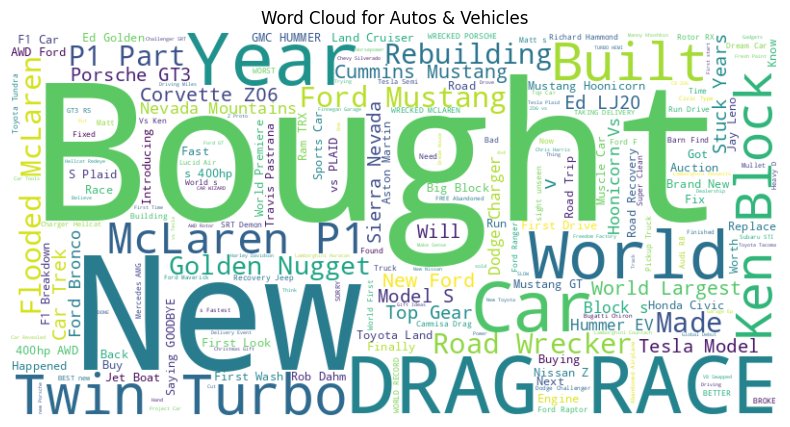

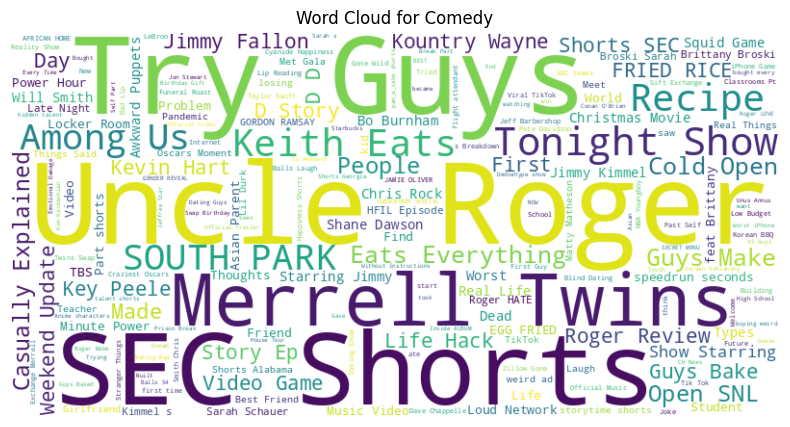

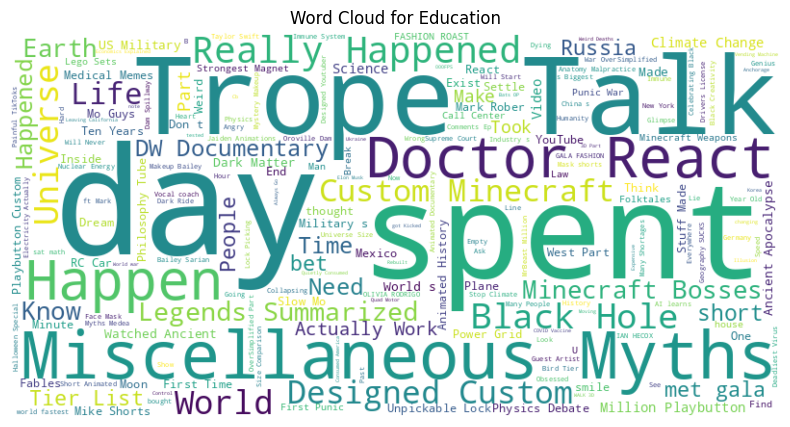

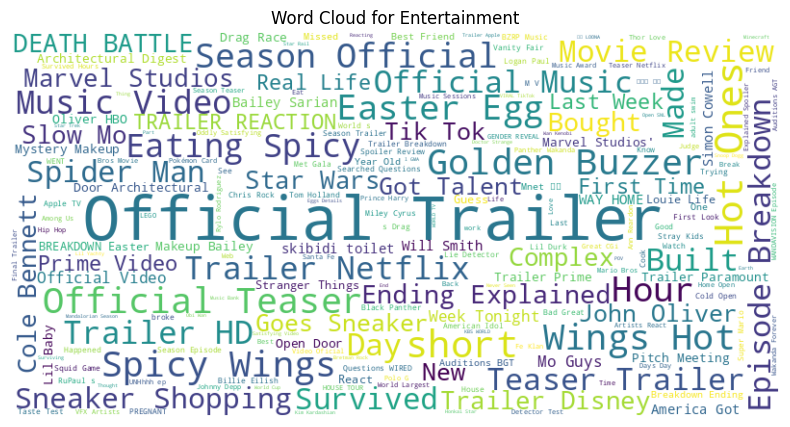

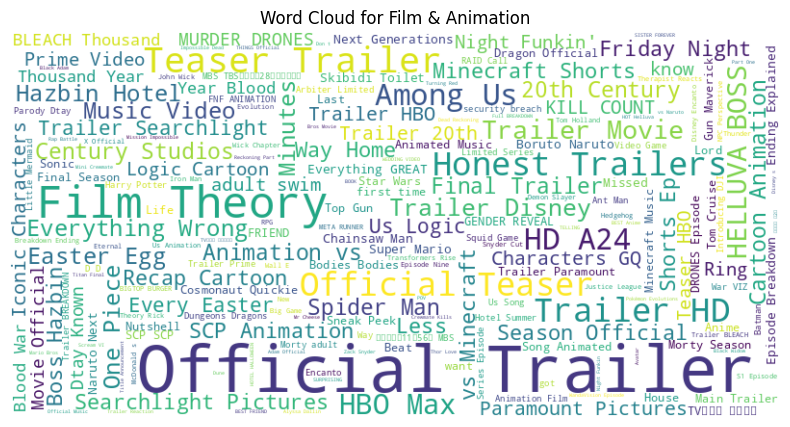

...

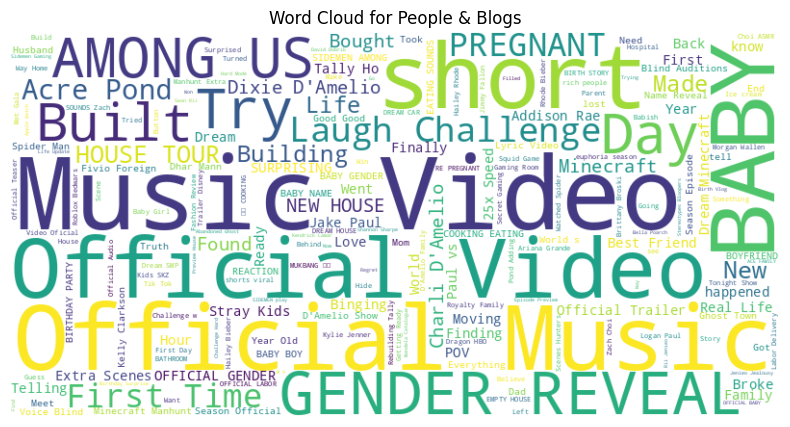

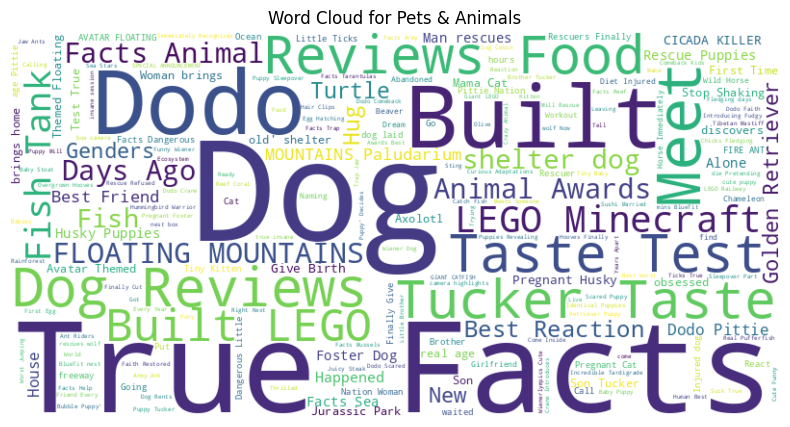

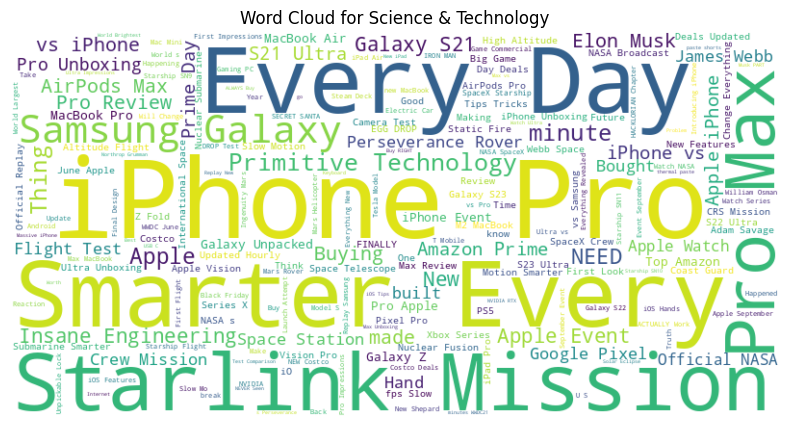

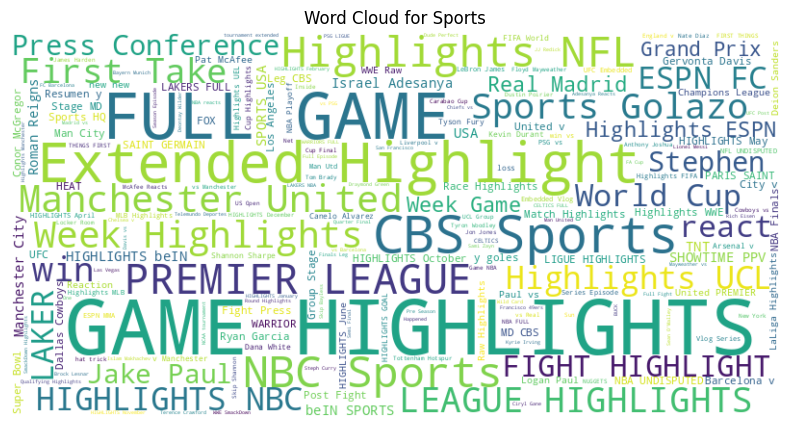

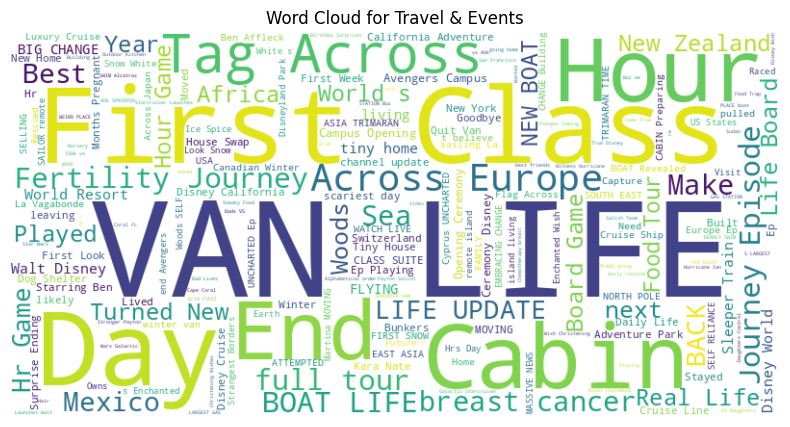

In [ ]:
def create_word_cloud(category_name, title):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(title))

    # Create a plot for the word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for {category_name}')
    plt.axis('off')
    plt.show()

# Loop through each grouped category
for category_name, group_data in grouped:
    title_in_category = group_data['title']
    create_word_cloud(category_name, title_in_category)

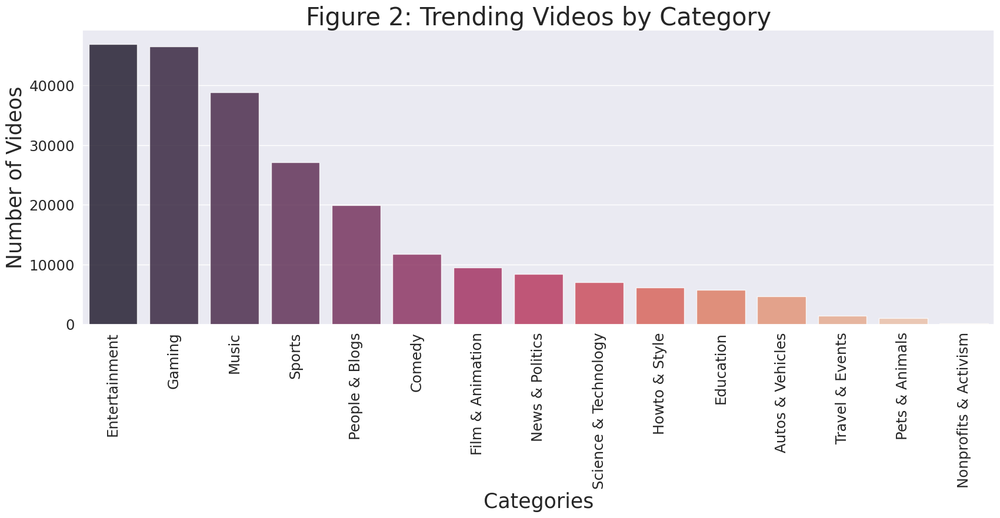

In [ ]:
sns.set_style("darkgrid")
sns.set(font_scale=1.6)

categories = usData['category_name'].value_counts()

plt.figure(figsize=(20,6.5))
sns.barplot(x=categories.index, y=categories.values, alpha=0.8, palette="rocket")

sns.set(font_scale=1.6)
plt.xticks(rotation=90)
plt.xlabel('Categories', fontsize=25)
plt.ylabel('Number of Videos', fontsize=25)
plt.title('Figure 2: Trending Videos by Category', fontsize=30)
plt.show()

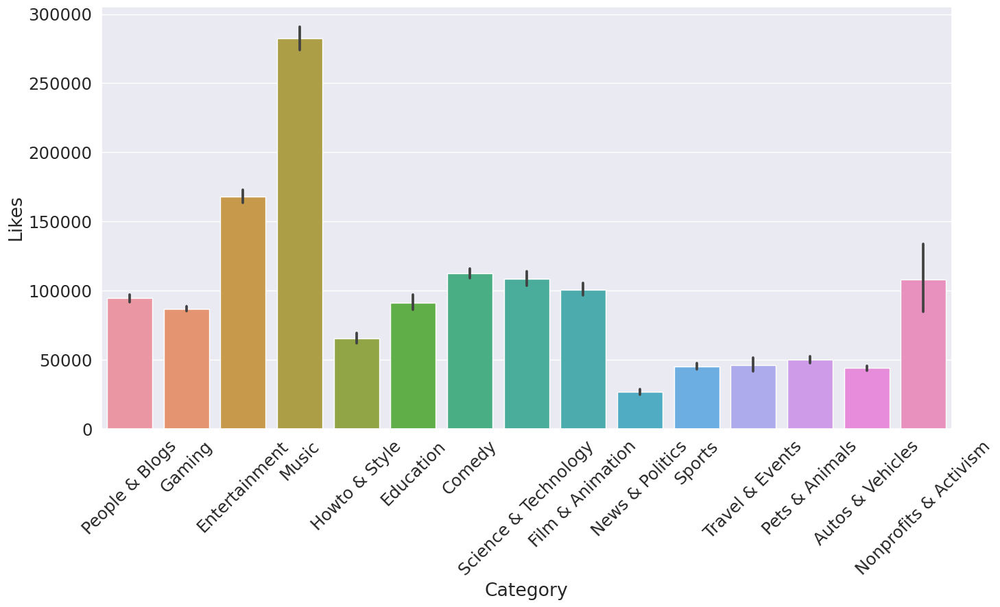

In [ ]:
plt.figure(figsize=(16,8))
sns.barplot(x="category_name", y="likes", data=usData)
plt.xlabel("Category")
plt.ylabel("Likes")
plt.xticks(rotation=45)
plt.show()

In [ ]:
from zmq.constants import NULL
def clean_trending_date(date):
    y,d,m = date.split('T')[0].split('-')
    return datetime.date(int(y), int(d), int(m))

def clean_publishedAt(time):
    y,d,m = time.split('T')[0].split('-')
    return datetime.date(int(y), int(d), int(m))

In [ ]:
usData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 235387 entries, 0 to 235386
Data columns (total 18 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   video_id           235387 non-null  object
 1   title              235387 non-null  object
 2   publishedAt        235387 non-null  object
 3   title_lang         235387 non-null  object
 4   channelId          235387 non-null  object
 5   channelTitle       235387 non-null  object
 6   categoryId         235387 non-null  int64 
 7   trending_date      235387 non-null  object
 8   tags               235387 non-null  object
 9   view_count         235387 non-null  int64 
 10  likes              235387 non-null  int64 
 11  dislikes           235387 non-null  int64 
 12  comment_count      235387 non-null  int64 
 13  thumbnail_link     235387 non-null  object
 14  comments_disabled  235387 non-null  int8  
 15  ratings_disabled   235387 non-null  int8  
 16  description        2

In [ ]:
usData['trending_date'] = usData['trending_date'].apply(clean_trending_date)

usData.head()

,video_id,title,publishedAt,title_lang,channelId,channelTitle,categoryId,trending_date,tags,view_count,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description,category_name
0,3C66w5Z0ixs,I ASKED HER TO BE MY GIRLFRIEND...,2020-08-11T19:20:14Z,en,UCvtRTOMP2TqYqu51xNrqAzg,Brawadis,22,2020-08-12,brawadis|prank|basketball|skits|ghost|funny vi...,1514614,156908,5855,35313,https://i.ytimg.com/vi/3C66w5Z0ixs/default.jpg,0,0,SUBSCRIBE to BRAWADIS ▶ http://bit.ly/Subscrib...,People & Blogs
1,M9Pmf9AB4Mo,Apex Legends | Stories from the Outlands – “Th...,2020-08-11T17:00:10Z,en,UC0ZV6M2THA81QT9hrVWJG3A,Apex Legends,20,2020-08-12,Apex Legends|Apex Legends characters|new Apex ...,2381688,146739,2794,16549,https://i.ytimg.com/vi/M9Pmf9AB4Mo/default.jpg,0,0,"While running her own modding shop, Ramya Pare...",Gaming
2,J78aPJ3VyNs,I left youtube for a month and THIS is what ha...,2020-08-11T16:34:06Z,en,UCYzPXprvl5Y-Sf0g4vX-m6g,jacksepticeye,24,2020-08-12,jacksepticeye|funny|funny meme|memes|jacksepti...,2038853,353787,2628,40221,https://i.ytimg.com/vi/J78aPJ3VyNs/default.jpg,0,0,I left youtube for a month and this is what ha...,Entertainment
3,kXLn3HkpjaA,XXL 2020 Freshman Class Revealed - Official An...,2020-08-11T16:38:55Z,en,UCbg_UMjlHJg_19SZckaKajg,XXL,10,2020-08-12,xxl freshman|xxl freshmen|2020 xxl freshman|20...,496771,23251,1856,7647,https://i.ytimg.com/vi/kXLn3HkpjaA/default.jpg,0,0,Subscribe to XXL → http://bit.ly/subscribe-xxl...,Music
4,VIUo6yapDbc,Ultimate DIY Home Movie Theater for The LaBran...,2020-08-11T15:10:05Z,en,UCDVPcEbVLQgLZX0Rt6jo34A,Mr. Kate,26,2020-08-12,The LaBrant Family|DIY|Interior Design|Makeove...,1123889,45802,964,2196,https://i.ytimg.com/vi/VIUo6yapDbc/default.jpg,0,0,Transforming The LaBrant Family's empty white ...,Howto & Style


In [ ]:
usData.head()

,video_id,title,publishedAt,title_lang,channelId,channelTitle,categoryId,trending_date,tags,view_count,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description,category_name
0,3C66w5Z0ixs,I ASKED HER TO BE MY GIRLFRIEND...,2020-08-11T19:20:14Z,en,UCvtRTOMP2TqYqu51xNrqAzg,Brawadis,22,2020-08-12,brawadis|prank|basketball|skits|ghost|funny vi...,1514614,156908,5855,35313,https://i.ytimg.com/vi/3C66w5Z0ixs/default.jpg,0,0,SUBSCRIBE to BRAWADIS ▶ http://bit.ly/Subscrib...,People & Blogs
1,M9Pmf9AB4Mo,Apex Legends | Stories from the Outlands – “Th...,2020-08-11T17:00:10Z,en,UC0ZV6M2THA81QT9hrVWJG3A,Apex Legends,20,2020-08-12,Apex Legends|Apex Legends characters|new Apex ...,2381688,146739,2794,16549,https://i.ytimg.com/vi/M9Pmf9AB4Mo/default.jpg,0,0,"While running her own modding shop, Ramya Pare...",Gaming
2,J78aPJ3VyNs,I left youtube for a month and THIS is what ha...,2020-08-11T16:34:06Z,en,UCYzPXprvl5Y-Sf0g4vX-m6g,jacksepticeye,24,2020-08-12,jacksepticeye|funny|funny meme|memes|jacksepti...,2038853,353787,2628,40221,https://i.ytimg.com/vi/J78aPJ3VyNs/default.jpg,0,0,I left youtube for a month and this is what ha...,Entertainment
3,kXLn3HkpjaA,XXL 2020 Freshman Class Revealed - Official An...,2020-08-11T16:38:55Z,en,UCbg_UMjlHJg_19SZckaKajg,XXL,10,2020-08-12,xxl freshman|xxl freshmen|2020 xxl freshman|20...,496771,23251,1856,7647,https://i.ytimg.com/vi/kXLn3HkpjaA/default.jpg,0,0,Subscribe to XXL → http://bit.ly/subscribe-xxl...,Music
4,VIUo6yapDbc,Ultimate DIY Home Movie Theater for The LaBran...,2020-08-11T15:10:05Z,en,UCDVPcEbVLQgLZX0Rt6jo34A,Mr. Kate,26,2020-08-12,The LaBrant Family|DIY|Interior Design|Makeove...,1123889,45802,964,2196,https://i.ytimg.com/vi/VIUo6yapDbc/default.jpg,0,0,Transforming The LaBrant Family's empty white ...,Howto & Style


In [ ]:
usData['publishedAt'] = usData['publishedAt'].apply(clean_publishedAt)

In [ ]:
usData.head()

,video_id,title,publishedAt,title_lang,channelId,channelTitle,categoryId,trending_date,tags,view_count,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description,category_name
0,3C66w5Z0ixs,I ASKED HER TO BE MY GIRLFRIEND...,2020-08-11,en,UCvtRTOMP2TqYqu51xNrqAzg,Brawadis,22,2020-08-12,brawadis|prank|basketball|skits|ghost|funny vi...,1514614,156908,5855,35313,https://i.ytimg.com/vi/3C66w5Z0ixs/default.jpg,0,0,SUBSCRIBE to BRAWADIS ▶ http://bit.ly/Subscrib...,People & Blogs
1,M9Pmf9AB4Mo,Apex Legends | Stories from the Outlands – “Th...,2020-08-11,en,UC0ZV6M2THA81QT9hrVWJG3A,Apex Legends,20,2020-08-12,Apex Legends|Apex Legends characters|new Apex ...,2381688,146739,2794,16549,https://i.ytimg.com/vi/M9Pmf9AB4Mo/default.jpg,0,0,"While running her own modding shop, Ramya Pare...",Gaming
2,J78aPJ3VyNs,I left youtube for a month and THIS is what ha...,2020-08-11,en,UCYzPXprvl5Y-Sf0g4vX-m6g,jacksepticeye,24,2020-08-12,jacksepticeye|funny|funny meme|memes|jacksepti...,2038853,353787,2628,40221,https://i.ytimg.com/vi/J78aPJ3VyNs/default.jpg,0,0,I left youtube for a month and this is what ha...,Entertainment
3,kXLn3HkpjaA,XXL 2020 Freshman Class Revealed - Official An...,2020-08-11,en,UCbg_UMjlHJg_19SZckaKajg,XXL,10,2020-08-12,xxl freshman|xxl freshmen|2020 xxl freshman|20...,496771,23251,1856,7647,https://i.ytimg.com/vi/kXLn3HkpjaA/default.jpg,0,0,Subscribe to XXL → http://bit.ly/subscribe-xxl...,Music
4,VIUo6yapDbc,Ultimate DIY Home Movie Theater for The LaBran...,2020-08-11,en,UCDVPcEbVLQgLZX0Rt6jo34A,Mr. Kate,26,2020-08-12,The LaBrant Family|DIY|Interior Design|Makeove...,1123889,45802,964,2196,https://i.ytimg.com/vi/VIUo6yapDbc/default.jpg,0,0,Transforming The LaBrant Family's empty white ...,Howto & Style


In [ ]:
def clean_tags(tag):
    if tag == '[none]': return []
    return tag.lower().replace('"','').split('|')

In [ ]:
usData['tags'] = usData['tags'].apply(clean_tags)
usData.head(n=2)

,video_id,title,publishedAt,title_lang,channelId,channelTitle,categoryId,trending_date,tags,view_count,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description,category_name
0,3C66w5Z0ixs,I ASKED HER TO BE MY GIRLFRIEND...,2020-08-11,en,UCvtRTOMP2TqYqu51xNrqAzg,Brawadis,22,2020-08-12,"[brawadis, prank, basketball, skits, ghost, fu...",1514614,156908,5855,35313,https://i.ytimg.com/vi/3C66w5Z0ixs/default.jpg,0,0,SUBSCRIBE to BRAWADIS ▶ http://bit.ly/Subscrib...,People & Blogs
1,M9Pmf9AB4Mo,Apex Legends | Stories from the Outlands – “Th...,2020-08-11,en,UC0ZV6M2THA81QT9hrVWJG3A,Apex Legends,20,2020-08-12,"[apex legends, apex legends characters, new ap...",2381688,146739,2794,16549,https://i.ytimg.com/vi/M9Pmf9AB4Mo/default.jpg,0,0,"While running her own modding shop, Ramya Pare...",Gaming


In [ ]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
def clean_titles(title):
    tokens = title.lower().split()
    cleaned = []
    sw = set(stopwords.words('english'))
    for token in tokens:
        if token.startswith('$') or token.isnumeric() or not token.isalnum() or token in sw:  # Remove money amount, non-alphanumeric tokens, or stopwords
            continue
        else:
            cleaned.append(token)
    return ' '.join(cleaned)

usData['title_cl'] = usData['title'].apply(clean_titles)

#Lets check for result
usData.head()

,video_id,title,publishedAt,title_lang,channelId,channelTitle,categoryId,trending_date,tags,view_count,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description,category_name,title_cl
0,3C66w5Z0ixs,I ASKED HER TO BE MY GIRLFRIEND...,2020-08-11,en,UCvtRTOMP2TqYqu51xNrqAzg,Brawadis,22,2020-08-12,"[brawadis, prank, basketball, skits, ghost, fu...",1514614,156908,5855,35313,https://i.ytimg.com/vi/3C66w5Z0ixs/default.jpg,0,0,SUBSCRIBE to BRAWADIS ▶ http://bit.ly/Subscrib...,People & Blogs,asked
1,M9Pmf9AB4Mo,Apex Legends | Stories from the Outlands – “Th...,2020-08-11,en,UC0ZV6M2THA81QT9hrVWJG3A,Apex Legends,20,2020-08-12,"[apex legends, apex legends characters, new ap...",2381688,146739,2794,16549,https://i.ytimg.com/vi/M9Pmf9AB4Mo/default.jpg,0,0,"While running her own modding shop, Ramya Pare...",Gaming,apex legends stories outlands
2,J78aPJ3VyNs,I left youtube for a month and THIS is what ha...,2020-08-11,en,UCYzPXprvl5Y-Sf0g4vX-m6g,jacksepticeye,24,2020-08-12,"[jacksepticeye, funny, funny meme, memes, jack...",2038853,353787,2628,40221,https://i.ytimg.com/vi/J78aPJ3VyNs/default.jpg,0,0,I left youtube for a month and this is what ha...,Entertainment,left youtube month
3,kXLn3HkpjaA,XXL 2020 Freshman Class Revealed - Official An...,2020-08-11,en,UCbg_UMjlHJg_19SZckaKajg,XXL,10,2020-08-12,"[xxl freshman, xxl freshmen, 2020 xxl freshman...",496771,23251,1856,7647,https://i.ytimg.com/vi/kXLn3HkpjaA/default.jpg,0,0,Subscribe to XXL → http://bit.ly/subscribe-xxl...,Music,xxl freshman class revealed official announcement
4,VIUo6yapDbc,Ultimate DIY Home Movie Theater for The LaBran...,2020-08-11,en,UCDVPcEbVLQgLZX0Rt6jo34A,Mr. Kate,26,2020-08-12,"[the labrant family, diy, interior design, mak...",1123889,45802,964,2196,https://i.ytimg.com/vi/VIUo6yapDbc/default.jpg,0,0,Transforming The LaBrant Family's empty white ...,Howto & Style,ultimate diy home movie theater labrant


<ipython-input-27-d940d465d4f4>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(usData.corr(), annot=True, cmap= sns.color_palette("rocket_r", as_cmap=True), center=0)


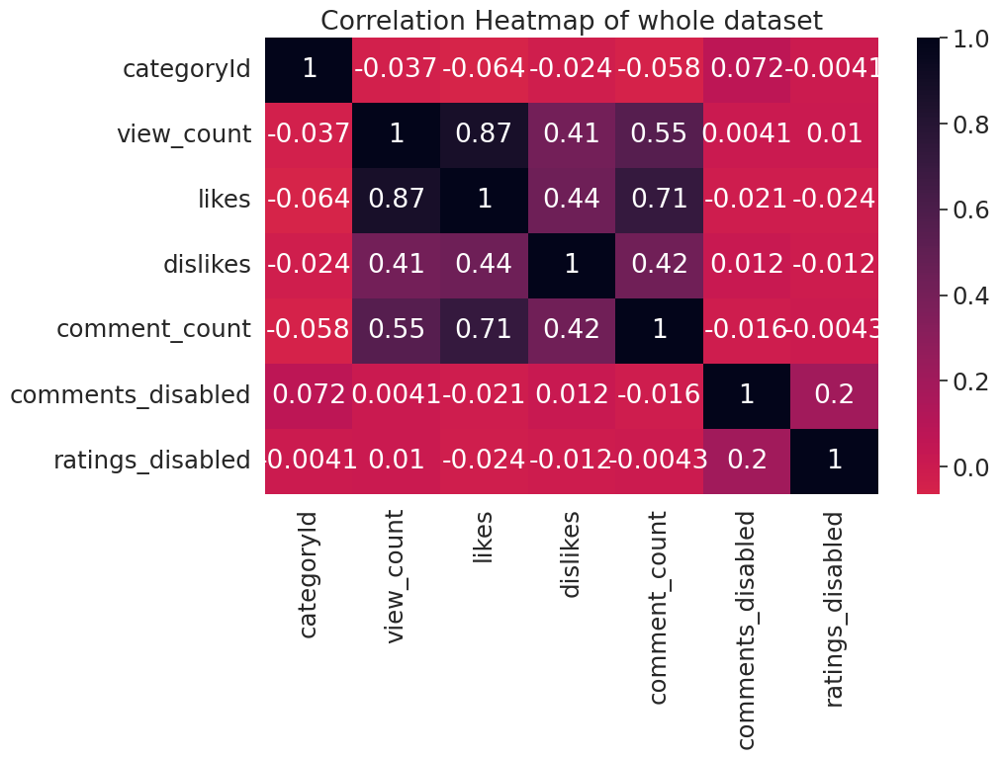

In [ ]:
plt.figure(figsize=(10, 6))
sns.heatmap(usData.corr(), annot=True, cmap= sns.color_palette("rocket_r", as_cmap=True), center=0)
plt.title('Correlation Heatmap of whole dataset')
plt.show()

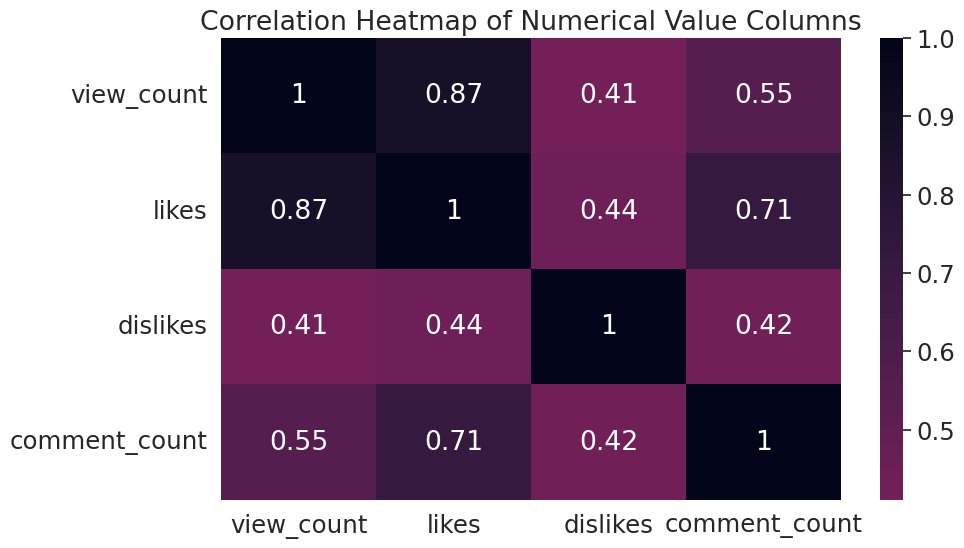

In [ ]:
numerical_columns = ['view_count', 'likes', 'dislikes', 'comment_count']

correlation_matrix = usData[numerical_columns].corr()

# Create a heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap= sns.color_palette("rocket_r", as_cmap=True), center=0)
plt.title('Correlation Heatmap of Numerical Value Columns')
plt.show()

In [ ]:
usData.isna().sum()

video_id                0
title                   0
publishedAt             0
title_lang              0
channelId               0
channelTitle            0
categoryId              0
trending_date           0
tags                    0
view_count              0
likes                   0
dislikes                0
comment_count           0
thumbnail_link          0
comments_disabled       0
ratings_disabled        0
description          4418
category_name           0
title_cl                0
dtype: int64

In [ ]:
usData['description'].fillna("")

0         SUBSCRIBE to BRAWADIS ▶ http://bit.ly/Subscrib...
1         While running her own modding shop, Ramya Pare...
2         I left youtube for a month and this is what ha...
3         Subscribe to XXL → http://bit.ly/subscribe-xxl...
4         Transforming The LaBrant Family's empty white ...
                                ...                        
235382    ► SUBSCRIBE to the Channel! https://www.youtub...
235383    breakout starsHEARTSTEEL is a band. kayn, ezre...
235384    This Halloween, Freddy and the gang are dying ...
235385    Thanks to Gamer Supps for partnering up with m...
235386    Are you single and ready to minggg... er i mea...
Name: description, Length: 235387, dtype: object

In [ ]:
usData.isna().sum()

video_id                0
title                   0
publishedAt             0
title_lang              0
channelId               0
channelTitle            0
categoryId              0
trending_date           0
tags                    0
view_count              0
likes                   0
dislikes                0
comment_count           0
thumbnail_link          0
comments_disabled       0
ratings_disabled        0
description          4418
category_name           0
title_cl                0
dtype: int64

In [ ]:
usData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 235387 entries, 0 to 235386
Data columns (total 19 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   video_id           235387 non-null  object
 1   title              235387 non-null  object
 2   publishedAt        235387 non-null  object
 3   title_lang         235387 non-null  object
 4   channelId          235387 non-null  object
 5   channelTitle       235387 non-null  object
 6   categoryId         235387 non-null  int64 
 7   trending_date      235387 non-null  object
 8   tags               235387 non-null  object
 9   view_count         235387 non-null  int64 
 10  likes              235387 non-null  int64 
 11  dislikes           235387 non-null  int64 
 12  comment_count      235387 non-null  int64 
 13  thumbnail_link     235387 non-null  object
 14  comments_disabled  235387 non-null  int8  
 15  ratings_disabled   235387 non-null  int8  
 16  description        2

Dropping records with likes > view_count.

In [ ]:
usData[usData.likes>usData['view_count']]

,video_id,title,publishedAt,title_lang,channelId,channelTitle,categoryId,trending_date,tags,view_count,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description,category_name,title_cl
15289,r7nYQXsxJdU,HBCU Homecoming 2020: Meet Me On The Yard,2020-10-25,en,UCqVDpXKLmKeBU_yyt_QkItQ,YouTube Originals,24,2020-10-27,"[2 chainz, desi banks, lionel richie , lance g...",0,4257,384,240,https://i.ytimg.com/vi/r7nYQXsxJdU/default.jpg,0,0,HBCU Homecoming 2020 is going down! We welcome...,Entertainment,hbcu homecoming meet yard
15577,r7nYQXsxJdU,HBCU Homecoming 2020: Meet Me On The Yard,2020-10-25,en,UCqVDpXKLmKeBU_yyt_QkItQ,YouTube Originals,24,2020-10-29,"[2 chainz, desi banks, lionel richie , lance g...",0,4420,388,261,https://i.ytimg.com/vi/r7nYQXsxJdU/default.jpg,0,0,HBCU Homecoming 2020 is going down! We welcome...,Entertainment,hbcu homecoming meet yard
22415,F44gmxjRVzc,Watch Lil Baby’s birthday celebration on RELEASED,2020-12-04,en,UCVS88tG_NYgxF6Udnx2815Q,Lil Baby Official 4PF,10,2020-12-04,"[new music, new music friday's, released youtu...",0,10785,78,264,https://i.ytimg.com/vi/F44gmxjRVzc/default.jpg,0,0,New Lil Baby music video Errybody; watch now h...,Music,watch lil birthday celebration released
73992,HcSwBJY7Xew,Watch The Weeknd and create short videos on th...,2021-08-10,en,UCBR8-60-B28hp2BmDPdntcQ,YouTube,27,2021-08-11,[[none]],0,50071,7256,0,https://i.ytimg.com/vi/HcSwBJY7Xew/default.jpg,1,0,NaN,Education,watch weeknd create short videos youtube
74267,Hb3rmh-_FMw,Introducing the shorter side of YouTube,2021-08-10,en,UCBR8-60-B28hp2BmDPdntcQ,YouTube,27,2021-08-12,[[none]],0,18653,1545,0,https://i.ytimg.com/vi/Hb3rmh-_FMw/default.jpg,1,0,*****EPILEPSY WARNING ********Watch and create...,Education,introducing shorter side youtube
74492,Hb3rmh-_FMw,Introducing the shorter side of YouTube,2021-08-10,en,UCBR8-60-B28hp2BmDPdntcQ,YouTube,27,2021-08-13,[[none]],0,22030,1604,0,https://i.ytimg.com/vi/Hb3rmh-_FMw/default.jpg,1,0,*****EPILEPSY WARNING ********Watch and create...,Education,introducing shorter side youtube
74720,Hb3rmh-_FMw,Introducing the shorter side of YouTube,2021-08-10,en,UCBR8-60-B28hp2BmDPdntcQ,YouTube,27,2021-08-14,[[none]],0,22323,1595,0,https://i.ytimg.com/vi/Hb3rmh-_FMw/default.jpg,1,0,*****EPILEPSY WARNING ********Watch and create...,Education,introducing shorter side youtube
74964,Hb3rmh-_FMw,Introducing the shorter side of YouTube,2021-08-10,en,UCBR8-60-B28hp2BmDPdntcQ,YouTube,27,2021-08-15,[[none]],0,22585,1636,0,https://i.ytimg.com/vi/Hb3rmh-_FMw/default.jpg,1,0,*****EPILEPSY WARNING ********Watch and create...,Education,introducing shorter side youtube
137488,xWLoeDcJwvU,#LiveFromTheUpsideDown brought to you by Dorit...,2022-06-23,en,UCGTGlZDAATNAAXINMLj4jgw,Doritos,10,2022-06-26,[[none]],0,8569,0,504,https://i.ytimg.com/vi/xWLoeDcJwvU/default.jpg,0,0,"Charli XCX, Soft Cell, The Go-Go’s, and Corey ...",Music,brought doritos stranger things
137724,xWLoeDcJwvU,#LiveFromTheUpsideDown brought to you by Dorit...,2022-06-23,en,UCGTGlZDAATNAAXINMLj4jgw,Doritos,10,2022-06-27,[[none]],0,8786,0,520,https://i.ytimg.com/vi/xWLoeDcJwvU/default.jpg,0,0,"Charli XCX, Soft Cell, The Go-Go’s, and Corey ...",Music,brought doritos stranger things


In [ ]:
usData.drop(usData[usData.likes>usData['view_count']].index,inplace=True)

In [ ]:
usData.head()

,video_id,title,publishedAt,title_lang,channelId,channelTitle,categoryId,trending_date,tags,view_count,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description,category_name,title_cl
0,3C66w5Z0ixs,I ASKED HER TO BE MY GIRLFRIEND...,2020-08-11,en,UCvtRTOMP2TqYqu51xNrqAzg,Brawadis,22,2020-08-12,"[brawadis, prank, basketball, skits, ghost, fu...",1514614,156908,5855,35313,https://i.ytimg.com/vi/3C66w5Z0ixs/default.jpg,0,0,SUBSCRIBE to BRAWADIS ▶ http://bit.ly/Subscrib...,People & Blogs,asked
1,M9Pmf9AB4Mo,Apex Legends | Stories from the Outlands – “Th...,2020-08-11,en,UC0ZV6M2THA81QT9hrVWJG3A,Apex Legends,20,2020-08-12,"[apex legends, apex legends characters, new ap...",2381688,146739,2794,16549,https://i.ytimg.com/vi/M9Pmf9AB4Mo/default.jpg,0,0,"While running her own modding shop, Ramya Pare...",Gaming,apex legends stories outlands
2,J78aPJ3VyNs,I left youtube for a month and THIS is what ha...,2020-08-11,en,UCYzPXprvl5Y-Sf0g4vX-m6g,jacksepticeye,24,2020-08-12,"[jacksepticeye, funny, funny meme, memes, jack...",2038853,353787,2628,40221,https://i.ytimg.com/vi/J78aPJ3VyNs/default.jpg,0,0,I left youtube for a month and this is what ha...,Entertainment,left youtube month
3,kXLn3HkpjaA,XXL 2020 Freshman Class Revealed - Official An...,2020-08-11,en,UCbg_UMjlHJg_19SZckaKajg,XXL,10,2020-08-12,"[xxl freshman, xxl freshmen, 2020 xxl freshman...",496771,23251,1856,7647,https://i.ytimg.com/vi/kXLn3HkpjaA/default.jpg,0,0,Subscribe to XXL → http://bit.ly/subscribe-xxl...,Music,xxl freshman class revealed official announcement
4,VIUo6yapDbc,Ultimate DIY Home Movie Theater for The LaBran...,2020-08-11,en,UCDVPcEbVLQgLZX0Rt6jo34A,Mr. Kate,26,2020-08-12,"[the labrant family, diy, interior design, mak...",1123889,45802,964,2196,https://i.ytimg.com/vi/VIUo6yapDbc/default.jpg,0,0,Transforming The LaBrant Family's empty white ...,Howto & Style,ultimate diy home movie theater labrant


Engagement Rate: Engagement rate as the sum of likes, dislikes, and comments divided by the total view_count. This metric provides an overall sense of how actively the community is interacting with the video.

Like-to-Dislike Ratio: Ratio of likes to dislikes. A higher ratio indicates that the community generally has a positive sentiment towards the video.

Comment-to-View Ratio: Ratio of comments to view_count. This can help identify videos that generate more discussion and engagement within the community.

Likes per Comment: Average number of likes per comment. A higher value suggests that the community is showing appreciation for the content through likes.

Dislikes per Comment: Average number of dislikes per comment. This can provide insights into the level of criticism or disagreement within the community.

Likes per Day: Average number of likes the video receives per day since its publication. This can indicate how consistent engagement has been over time.

Comments per Day: Average number of comments the video receives per day since its publication. This can indicate ongoing community interaction.

View Velocity: Rate of increase in view_count over time since the video's publication. Videos with a higher view velocity might be gaining traction and could trend further.

In [ ]:
# date_list = usData['publishedAt'][0]

# # Convert to datetime
# date_object = datetime(date_list[0]+2000, date_list[1], date_list[2])
# data_object

In [ ]:
usData['engagement_rate'] = (usData['likes'] + usData['dislikes'] + usData['comment_count']) / usData['view_count']
usData['like_dislike_ratio'] = usData['likes'] / usData['dislikes']
usData['comment_view_ratio'] = usData['comment_count'] / usData['view_count']
usData['likes_per_comment'] = usData['likes'] / usData['comment_count']
usData['dislikes_per_comment'] = usData['dislikes'] / usData['comment_count']

# Calculate days since publication
usData['publishedAt'] = pd.to_datetime(usData['publishedAt'], format='%Y-%m-%d')
usData['days_since_publication'] = (pd.to_datetime('today') - usData['publishedAt']).dt.days

# Calculate likes per day and comments per day
usData['likes_per_day'] = usData['likes'] / usData['days_since_publication']
usData['comments_per_day'] = usData['comment_count'] / usData['days_since_publication']

# Calculate view velocity
usData['view_velocity'] = np.log(usData['view_count'] + 1) / (usData['days_since_publication'] + 1)
usData.head()

,video_id,title,publishedAt,title_lang,channelId,channelTitle,categoryId,trending_date,tags,view_count,...,title_cl,engagement_rate,like_dislike_ratio,comment_view_ratio,likes_per_comment,dislikes_per_comment,days_since_publication,likes_per_day,comments_per_day,view_velocity
0,3C66w5Z0ixs,I ASKED HER TO BE MY GIRLFRIEND...,2020-08-11,en,UCvtRTOMP2TqYqu51xNrqAzg,Brawadis,22,2020-08-12,"[brawadis, prank, basketball, skits, ghost, fu...",1514614,...,asked,0.130777,26.798975,0.023315,4.443349,0.165803,1213,129.355317,29.112119,0.011722
1,M9Pmf9AB4Mo,Apex Legends | Stories from the Outlands – “Th...,2020-08-11,en,UC0ZV6M2THA81QT9hrVWJG3A,Apex Legends,20,2020-08-12,"[apex legends, apex legends characters, new ap...",2381688,...,apex legends stories outlands,0.069733,52.519327,0.006948,8.866941,0.168832,1213,120.971970,13.643034,0.012095
2,J78aPJ3VyNs,I left youtube for a month and THIS is what ha...,2020-08-11,en,UCYzPXprvl5Y-Sf0g4vX-m6g,jacksepticeye,24,2020-08-12,"[jacksepticeye, funny, funny meme, memes, jack...",2038853,...,left youtube month,0.194539,134.622146,0.019727,8.796077,0.065339,1213,291.662819,33.158285,0.011967
3,kXLn3HkpjaA,XXL 2020 Freshman Class Revealed - Official An...,2020-08-11,en,UCbg_UMjlHJg_19SZckaKajg,XXL,10,2020-08-12,"[xxl freshman, xxl freshmen, 2020 xxl freshman...",496771,...,xxl freshman class revealed official announcement,0.065934,12.527478,0.015393,3.040539,0.242710,1213,19.168178,6.304204,0.010804
4,VIUo6yapDbc,Ultimate DIY Home Movie Theater for The LaBran...,2020-08-11,en,UCDVPcEbVLQgLZX0Rt6jo34A,Mr. Kate,26,2020-08-12,"[the labrant family, diy, interior design, mak...",1123889,...,ultimate diy home movie theater labrant,0.043565,47.512448,0.001954,20.857013,0.438980,1213,37.759275,1.810387,0.011476


In [ ]:
usData_copy = usData

#Lets drop description and title_cl as those wont be nececary for our traning.
usData_copy.drop(columns=['description', 'title_cl'], inplace=True)

usData_copy.head(n=2)

,video_id,title,publishedAt,title_lang,channelId,channelTitle,categoryId,trending_date,tags,view_count,...,category_name,engagement_rate,like_dislike_ratio,comment_view_ratio,likes_per_comment,dislikes_per_comment,days_since_publication,likes_per_day,comments_per_day,view_velocity
0,3C66w5Z0ixs,I ASKED HER TO BE MY GIRLFRIEND...,2020-08-11,en,UCvtRTOMP2TqYqu51xNrqAzg,Brawadis,22,2020-08-12,"[brawadis, prank, basketball, skits, ghost, fu...",1514614,...,People & Blogs,0.130777,26.798975,0.023315,4.443349,0.165803,1213,129.355317,29.112119,0.011722
1,M9Pmf9AB4Mo,Apex Legends | Stories from the Outlands – “Th...,2020-08-11,en,UC0ZV6M2THA81QT9hrVWJG3A,Apex Legends,20,2020-08-12,"[apex legends, apex legends characters, new ap...",2381688,...,Gaming,0.069733,52.519327,0.006948,8.866941,0.168832,1213,120.971970,13.643034,0.012095


In [ ]:
usData_copy['engagement_rate'] = (usData_copy['likes'] + usData_copy['dislikes'] + usData_copy['comment_count']) / (usData_copy['view_count'] + 1e-6)
usData_copy['like_dislike_ratio'] = usData_copy['likes'] / (usData_copy['dislikes'] + 1e-6)
usData_copy['comment_view_ratio'] = usData_copy['comment_count'] / (usData_copy['view_count'] + 1e-6)
usData_copy['dislikes_per_comment'] = usData_copy['dislikes'] / (usData_copy['comment_count'] + 1e-6)

# Calculate days_since_publication, likes_per_day, comments_per_day, view_velocity
usData_copy['trending_date'] = pd.to_datetime(usData_copy['trending_date'], format='%Y-%m-%d')
usData_copy['days_since_publication'] = (usData_copy['trending_date'] - pd.to_datetime(usData_copy['publishedAt'])).dt.days
usData_copy['likes_per_day'] = usData_copy['likes'] / (usData_copy['days_since_publication'] + 1e-6)
usData_copy['comments_per_day'] = usData_copy['comment_count'] / (usData_copy['days_since_publication'] + 1e-6)
usData_copy['view_velocity'] = np.log(usData_copy['view_count'] + 1) / (usData_copy['days_since_publication'] + 1)



In [ ]:
usData_copy.isna().sum()

video_id                    0
title                       0
publishedAt                 0
title_lang                  0
channelId                   0
channelTitle                0
categoryId                  0
trending_date               0
tags                        0
view_count                  0
likes                       0
dislikes                    0
comment_count               0
thumbnail_link              0
comments_disabled           0
ratings_disabled            0
category_name               0
engagement_rate             0
like_dislike_ratio          0
comment_view_ratio          0
likes_per_comment         482
dislikes_per_comment        0
days_since_publication      0
likes_per_day               0
comments_per_day            0
view_velocity               0
dtype: int64

In [ ]:
# Calculate the median of the 'dislikes_per_comment' column
median_dislikes_per_comment = usData_copy['dislikes_per_comment'].median()

# Fill missing values with the median
usData_copy['dislikes_per_comment'].fillna(median_dislikes_per_comment, inplace=True)

# Calculate the median of the 'likes_per_comment' column
median_likes_per_comment = usData_copy['likes_per_comment'].median()

# Fill missing values with the median
usData_copy['likes_per_comment'].fillna(median_likes_per_comment, inplace=True)

# Calculate the median of the 'comments_per_day' column
median_comments_per_day = usData_copy['comments_per_day'].median()

# Fill missing values with the median
usData_copy['comments_per_day'].fillna(median_comments_per_day, inplace=True)

# Calculate the median of the 'view_velocity' column
median_view_velocity = usData_copy['view_velocity'].median()

# Fill missing values with the median
usData_copy['view_velocity'].fillna(median_view_velocity, inplace=True)

In [ ]:
usData_copy.isna().sum()

video_id                  0
title                     0
publishedAt               0
title_lang                0
channelId                 0
channelTitle              0
categoryId                0
trending_date             0
tags                      0
view_count                0
likes                     0
dislikes                  0
comment_count             0
thumbnail_link            0
comments_disabled         0
ratings_disabled          0
category_name             0
engagement_rate           0
like_dislike_ratio        0
comment_view_ratio        0
likes_per_comment         0
dislikes_per_comment      0
days_since_publication    0
likes_per_day             0
comments_per_day          0
view_velocity             0
dtype: int64

Dataset Separation

In [ ]:
usData_copy['publishedAt'] = pd.to_datetime(usData_copy['publishedAt'])

# Define date ranges
start_date_2020 = pd.to_datetime('2020-01-01')
end_date_2021 = pd.to_datetime('2021-12-31')
start_date_2022 = pd.to_datetime('2022-01-01')
start_date_2023 = pd.to_datetime('2023-01-01')

# Split the dataset into three based on the specified years
train_data = usData_copy[(usData_copy['publishedAt'] >= start_date_2020) & (usData_copy['publishedAt'] <= end_date_2021)]
test_data = usData_copy[(usData_copy['publishedAt'] >= start_date_2022) & (usData_copy['publishedAt'] <= start_date_2022 + pd.DateOffset(years=1, days=-1))]
prediction_data = usData_copy[usData_copy['publishedAt'] >= start_date_2023]

# Display the shape of each dataset
print("Training data shape:", train_data.shape)
print("Testing data shape:", test_data.shape)
print("Prediction data shape:", prediction_data.shape)

Training data shape: (102949, 26)
Testing data shape: (73243, 26)
Prediction data shape: (59176, 26)


Applying Random Forest

Training The Model

In [ ]:
features = ['view_count', 'likes', 'dislikes', 'comment_count', 'engagement_rate', 'like_dislike_ratio',
            'comment_view_ratio', 'dislikes_per_comment', 'days_since_publication', 'likes_per_day',
            'comments_per_day']

# Split the data into features and target variable
X_train = train_data[features]
y_train = train_data['view_velocity']

X_test = test_data[features]

# Initialize and train the RandomForestRegressor model
model = RandomForestRegressor(n_estimators=132, random_state=0)
model.fit(X_train, y_train)

# Make predictions on the test data
y_pred = model.predict(X_test)

# Extract the 'view_velocity' column from test_data
y_test = test_data['view_velocity']

In [ ]:
# Check for infinity values in X_train
inf_mask = np.isinf(X_train)
inf_columns = X_train.columns[inf_mask.any()]

# Check for very large values in X_train
large_mask = np.abs(X_train) > 1e10
large_columns = X_train.columns[large_mask.any()]

print("Features with infinity values:", inf_columns)
print("Features with very large values:", large_columns)


Features with infinity values: Index([], dtype='object')
Features with very large values: Index(['like_dislike_ratio', 'dislikes_per_comment', 'likes_per_day',
       'comments_per_day'],
      dtype='object')


Mean Squared Error: 1.484528318344256e-05
Root Mean Squared Error: 0.0038529577188755344
Mean Absolute Error: 0.0003545142413937866
Explained Variance Score: 0.9999932623449757


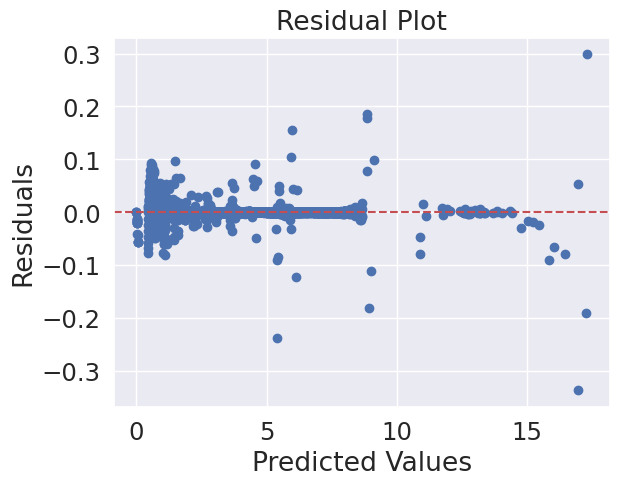

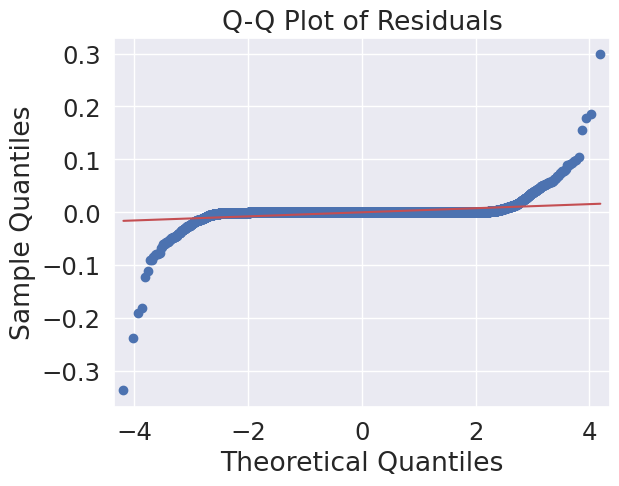

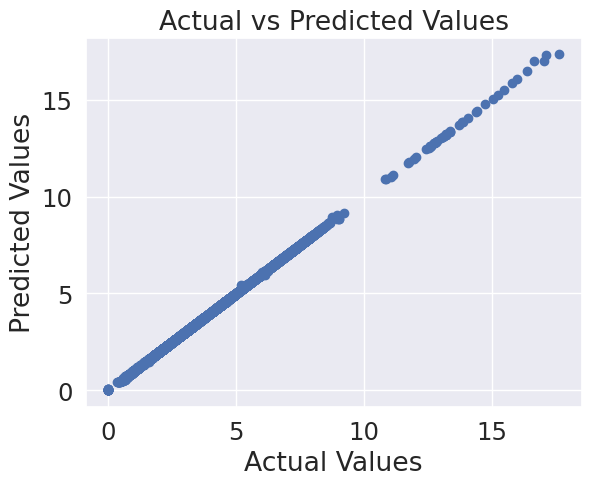

In [ ]:
# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

# Calculate Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print("Root Mean Squared Error:", rmse)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y_test, y_pred)
print("Mean Absolute Error:", mae)

# Calculate Explained Variance Score
evs = explained_variance_score(y_test, y_pred)
print("Explained Variance Score:", evs)

# Plot Residuals
residuals = y_test - y_pred
plt.scatter(y_pred, residuals)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.show()

# Quantile-Quantile (Q-Q) Plot of Residuals
import statsmodels.api as sm
qqplot = sm.qqplot(residuals, line='s')
plt.title('Q-Q Plot of Residuals')
plt.show()

# Visualize Predicted vs Actual Values
plt.scatter(y_test, y_pred)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.show()

Testing on Test Dataset

In [ ]:
# Check for NaN values
nan_check = test_data.isnull().sum()

# Check for infinite values
inf_check = test_data.replace([np.inf, -np.inf], np.nan).isnull().sum()

print("NaN Check:\n", nan_check)
print("\nInfinite Check:\n", inf_check)

NaN Check:
 video_id                  0
title                     0
publishedAt               0
title_lang                0
channelId                 0
channelTitle              0
categoryId                0
trending_date             0
tags                      0
view_count                0
likes                     0
dislikes                  0
comment_count             0
thumbnail_link            0
comments_disabled         0
ratings_disabled          0
category_name             0
engagement_rate           0
like_dislike_ratio        0
comment_view_ratio        0
likes_per_comment         0
dislikes_per_comment      0
days_since_publication    0
likes_per_day             0
comments_per_day          0
view_velocity             0
dtype: int64

Infinite Check:
 video_id                     0
title                        0
publishedAt                  0
title_lang                   0
channelId                    0
channelTitle                 0
categoryId                   0
trending_dat

In [ ]:
# Select features for testing
X_test = test_data[features]

# Make predictions on the test data
y_pred = model.predict(X_test)

# Create a DataFrame to store the predicted results
prediction_results = pd.DataFrame({'Title': test_data['title'],
                                   'Channel': test_data['channelTitle'],
                                   'Trending Date': test_data['trending_date'],
                                   'Actual View Velocity': test_data['view_velocity'],
                                   'Predicted View Velocity': y_pred})

# Display the prediction results
print(prediction_results)

                                                    Title  \
102391  Orange Bowl: Georgia Bulldogs vs. Michigan Wol...   
102393  Times Square 2022 Ball Drop in New York City: ...   
102396  Welcome to MOVE - A 30 Day Yoga Journey  |  Yo...   
102398  Happy New Year Live! 🎆 London Fireworks 2022 🔴...   
102399  Cotton Bowl: Alabama Crimson Tide vs. Cincinna...   
...                                                   ...   
176983              Dude Perfect vs. Luka Doncic (1-on-1)   
177913  Argentina and Lionel Messi are crowned World C...   
178160  Argentina and Lionel Messi are crowned World C...   
178379  Argentina and Lionel Messi are crowned World C...   
178581  Argentina and Lionel Messi are crowned World C...   

                      Channel Trending Date  Actual View Velocity  \
102391  ESPN College Football    2022-01-02              6.662381   
102393           News 19 WLTX    2022-01-02              6.655743   
102396      Yoga With Adriene    2022-01-02              6.5

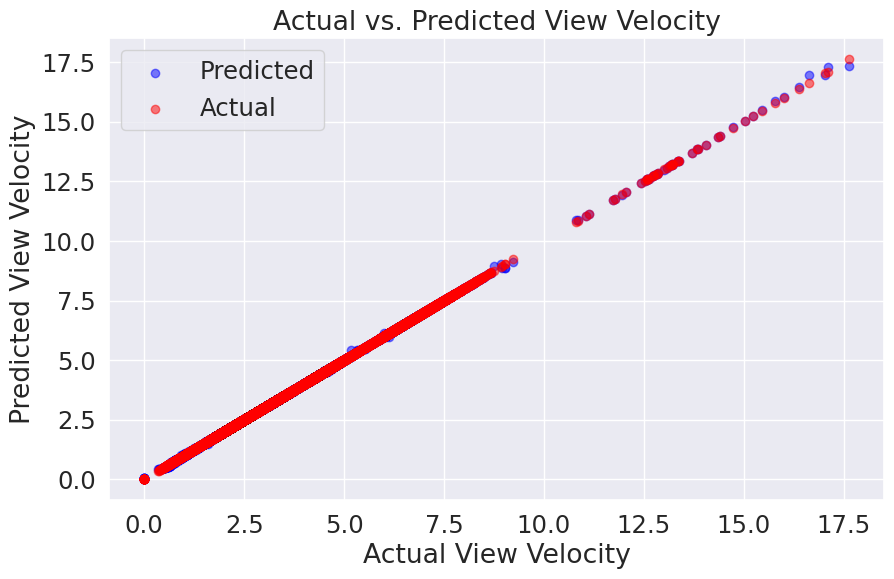

In [ ]:
# Create a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(prediction_results['Actual View Velocity'], prediction_results['Predicted View Velocity'], color='blue', label='Predicted', alpha=0.5)
plt.scatter(prediction_results['Actual View Velocity'], prediction_results['Actual View Velocity'], color='red', label='Actual', alpha=0.5)
plt.title('Actual vs. Predicted View Velocity')
plt.xlabel('Actual View Velocity')
plt.ylabel('Predicted View Velocity')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
def train_random_forest(n_estimators, max_depth, min_samples_split, min_samples_leaf):
    # Initialize and train the RandomForestRegressor model
    model = RandomForestRegressor(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        random_state=0
    )
    # Create a scatter plot
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_pred, color='blue', label='Predicted', alpha=0.5)
    plt.scatter(y_test, y_test, color='red', label='Actual', alpha=0.5)
    plt.title('Actual vs. Predicted View Velocity')
    plt.xlabel('Actual View Velocity')
    plt.ylabel('Predicted View Velocity')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Calculate Overall Accuracy
    non_zero_mask = y_test != 0
    overall_accuracy = 100 - np.mean(np.abs((y_pred - y_test) / np.maximum(y_test, 1e-10))[non_zero_mask]) * 100
    print(f'Overall Accuracy for Random Forest: {overall_accuracy:.2f}%')


# Define interactive sliders for hyperparameters
n_estimators_slider = widgets.IntSlider(value=132, min=1, max=200, step=1, description='n_estimators')
max_depth_slider = widgets.IntSlider(value=None, min=1, max=20, step=1, description='max_depth')
min_samples_split_slider = widgets.FloatSlider(value=2, min=1, max=10, step=0.1, description='min_samples_split')
min_samples_leaf_slider = widgets.FloatSlider(value=1, min=0.1, max=5, step=0.1, description='min_samples_leaf')

# Create an interactive interface
interactive_plot = widgets.interactive(
    train_random_forest,
    n_estimators=n_estimators_slider,
    max_depth=max_depth_slider,
    min_samples_split=min_samples_split_slider,
    min_samples_leaf=min_samples_leaf_slider
)

# Display the interactive interface
display(interactive_plot)

interactive(children=(IntSlider(value=132, description='n_estimators', max=200, min=1), IntSlider(value=1, des…

Final Prediction Using Ml Model

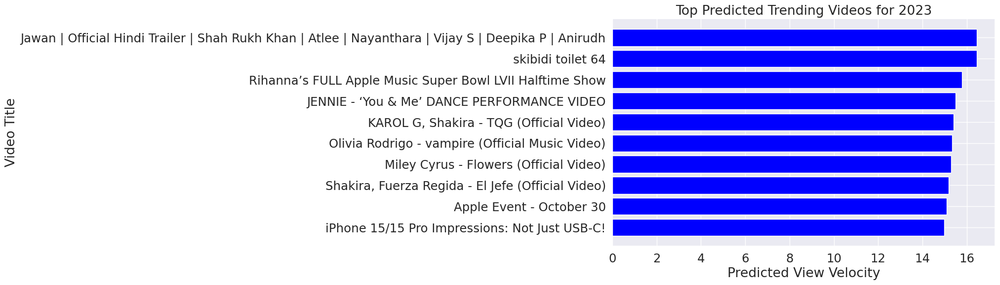

In [ ]:
# Select features for prediction
X_pred = prediction_data[features]

# Make predictions on the prediction data
predictions = model.predict(X_pred)

# Combine the predictions with video information
prediction_results = pd.DataFrame({'Title': prediction_data['title'], 'Channel': prediction_data['channelTitle'],
                                   'Published Date': prediction_data['publishedAt'], 'Trending Date': pd.to_datetime('2023-01-01'),
                                   'Predicted View Velocity': predictions})

# Sort the prediction results by predicted view velocity in descending order
prediction_results = prediction_results.sort_values(by='Predicted View Velocity', ascending=False)

# Visualize the top predicted videos
plt.figure(figsize=(10, 6))
plt.barh(prediction_results['Title'][:10], prediction_results['Predicted View Velocity'][:10], color='blue')
plt.xlabel('Predicted View Velocity')
plt.ylabel('Video Title')
plt.title('Top Predicted Trending Videos for 2023')
plt.gca().invert_yaxis()
plt.show()

Linear Regression

In [ ]:
from sklearn.linear_model import LinearRegression

In [ ]:
linearRegModel = LinearRegression()
linearRegModel.fit(X_train, y_train)

# Make predictions on the test data
y_pred = linearRegModel.predict(X_test)

# Extract the 'view_velocity' column from test_data
y_test = test_data['view_velocity']

Mean Squared Error: 0.9624692984757763
Root Mean Squared Error: 0.9810551964470584
Mean Absolute Error: 0.6259999020882062
Explained Variance Score: 0.5709386326943955


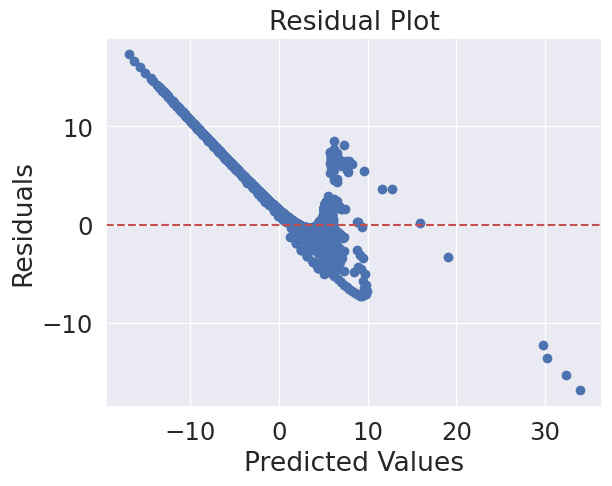

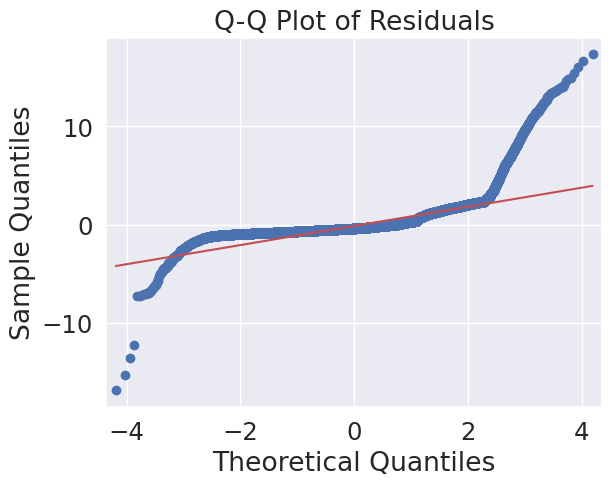

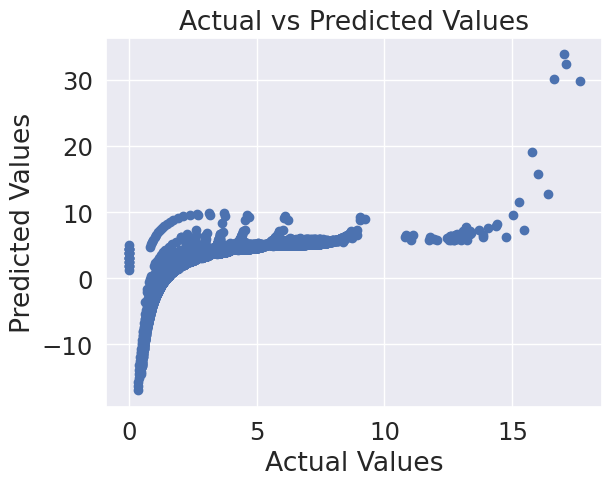

In [ ]:
# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

# Calculate Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print("Root Mean Squared Error:", rmse)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y_test, y_pred)
print("Mean Absolute Error:", mae)

# Calculate Explained Variance Score
evs = explained_variance_score(y_test, y_pred)
print("Explained Variance Score:", evs)

# Plot Residuals
residuals = y_test - y_pred
plt.scatter(y_pred, residuals)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.show()

# Quantile-Quantile (Q-Q) Plot of Residuals
import statsmodels.api as sm
qqplot = sm.qqplot(residuals, line='s')
plt.title('Q-Q Plot of Residuals')
plt.show()

# Visualize Predicted vs Actual Values
plt.scatter(y_test, y_pred)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.show()

In [ ]:
threshold = 0.05

# Calculate the percentage of predictions within the threshold
accuracy = np.mean(np.abs((y_pred - y_test) / y_test) <= threshold) * 100

print(f'Accuracy within {threshold * 100}%: {accuracy:.2f}%')

Accuracy within 5.0%: 13.05%


In [ ]:
# Select features for testing
X_test = test_data[features]

# Make predictions on the test data
y_pred = linearRegModel.predict(X_test)

# Create a DataFrame to store the predicted results
prediction_results = pd.DataFrame({'Title': test_data['title'],
                                   'Channel': test_data['channelTitle'],
                                   'Trending Date': test_data['trending_date'],
                                   'Actual View Velocity': test_data['view_velocity'],
                                   'Predicted View Velocity': y_pred})

# Display the prediction results
print(prediction_results)

                                                    Title  \
102391  Orange Bowl: Georgia Bulldogs vs. Michigan Wol...   
102393  Times Square 2022 Ball Drop in New York City: ...   
102396  Welcome to MOVE - A 30 Day Yoga Journey  |  Yo...   
102398  Happy New Year Live! 🎆 London Fireworks 2022 🔴...   
102399  Cotton Bowl: Alabama Crimson Tide vs. Cincinna...   
...                                                   ...   
176983              Dude Perfect vs. Luka Doncic (1-on-1)   
177913  Argentina and Lionel Messi are crowned World C...   
178160  Argentina and Lionel Messi are crowned World C...   
178379  Argentina and Lionel Messi are crowned World C...   
178581  Argentina and Lionel Messi are crowned World C...   

                      Channel Trending Date  Actual View Velocity  \
102391  ESPN College Football    2022-01-02              6.662381   
102393           News 19 WLTX    2022-01-02              6.655743   
102396      Yoga With Adriene    2022-01-02              6.5

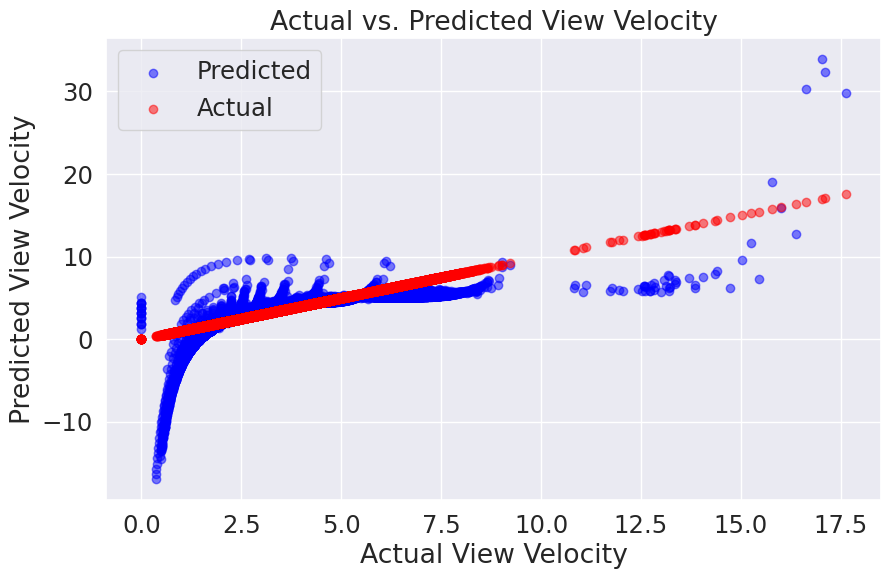

In [ ]:
# Create a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(prediction_results['Actual View Velocity'], prediction_results['Predicted View Velocity'], color='blue', label='Predicted', alpha=0.5)
plt.scatter(prediction_results['Actual View Velocity'], prediction_results['Actual View Velocity'], color='red', label='Actual', alpha=0.5)
plt.title('Actual vs. Predicted View Velocity')
plt.xlabel('Actual View Velocity')
plt.ylabel('Predicted View Velocity')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
def train_linear_regression():
    # Create sliders for hyperparameters
    threshold_slider = widgets.FloatSlider(value=0.05, min=0.01, max=0.1, step=0.01, description='Threshold:')

    # Display sliders
    display(threshold_slider)

    # Select features for testing
    X_test = usData[features]


    # Initialize the Linear Regression model
    linearRegModel = LinearRegression()

    # Train the model
    linearRegModel.fit(X_train, y_train)

    # Make predictions on the test data
    y_pred = linearRegModel.predict(X_test)

    # Extract the 'view_velocity' column from test_data
    y_test = usData['view_velocity']

    # Calculate Mean Squared Error (MSE)
    mse = mean_squared_error(y_test, y_pred)
    print("Mean Squared Error:", mse)

    # Calculate Root Mean Squared Error (RMSE)
    rmse = np.sqrt(mse)
    print("Root Mean Squared Error:", rmse)

    # Calculate Mean Absolute Error (MAE)
    mae = mean_absolute_error(y_test, y_pred)
    print("Mean Absolute Error:", mae)

    # Calculate Explained Variance Score
    evs = explained_variance_score(y_test, y_pred)
    print("Explained Variance Score:", evs)

    # Visualize Predicted vs Actual Values
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_pred, color='blue', label='Predicted', alpha=0.5)
    plt.scatter(y_test, y_test, color='red', label='Actual', alpha=0.5)
    plt.title('Actual vs Predicted View Velocity')
    plt.xlabel('Actual View Velocity')
    plt.ylabel('Predicted View Velocity')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Calculate Overall Accuracy
    non_zero_mask = y_test != 0
    overall_accuracy = 100 - np.mean(np.abs((y_pred - y_test) / np.maximum(y_test, 1e-10))[non_zero_mask]) * 100
    print(f'Overall Accuracy: {overall_accuracy:.2f}%')


    return y_test, y_pred

# Create sliders for hyperparameters
threshold_slider = widgets.FloatSlider(value=0.05, min=0.01, max=0.1, step=0.01, description='Threshold:')

# Create an interactive interface
interactive_plot = widgets.interactive(train_linear_regression, threshold=threshold_slider)
display(interactive_plot)

interactive(children=(Output(),), _dom_classes=('widget-interact',))

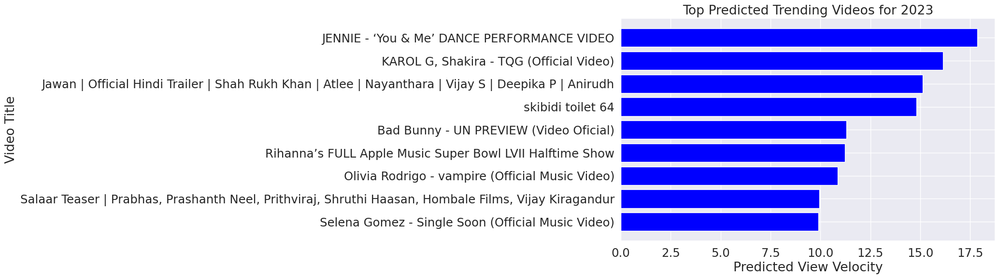

In [ ]:
# Select features for prediction
X_pred = prediction_data[features]

# Make predictions on the prediction data
predictions = linearRegModel.predict(X_pred)

# Combine the predictions with video information
prediction_results = pd.DataFrame({'Title': prediction_data['title'], 'Channel': prediction_data['channelTitle'],
                                   'Published Date': prediction_data['publishedAt'], 'Trending Date': pd.to_datetime('2023-01-01'),
                                   'Predicted View Velocity': predictions})

# Sort the prediction results by predicted view velocity in descending order
prediction_results = prediction_results.sort_values(by='Predicted View Velocity', ascending=False)

# Visualize the top predicted videos
plt.figure(figsize=(10, 6))
plt.barh(prediction_results['Title'][:10], prediction_results['Predicted View Velocity'][:10], color='blue')
plt.xlabel('Predicted View Velocity')
plt.ylabel('Video Title')
plt.title('Top Predicted Trending Videos for 2023')
plt.gca().invert_yaxis()
plt.show()

xgboost




In [ ]:
import xgboost as xgb

In [ ]:
xg_reg = xgb.XGBRegressor(objective ='reg:squarederror', colsample_bytree = 0.3, learning_rate = 0.1,
                max_depth = 5, alpha = 10, n_estimators = 10)

# Fit the model to the training data
xg_reg.fit(X_train, y_train)

# Predict on the test set
y_pred = xg_reg.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

Mean Squared Error: 0.9475404458314121


In [ ]:
y_pred = xg_reg.predict(X_test)

# Extract the 'view_velocity' column from test_data
y_test = test_data['view_velocity']

Mean Squared Error: 0.9475404458314121
Root Mean Squared Error: 0.9734168921029736
Mean Absolute Error: 0.7607212619004786
Explained Variance Score: 0.570030823352202


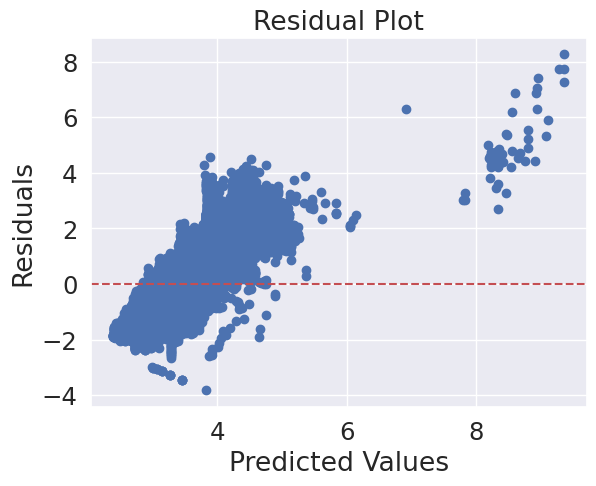

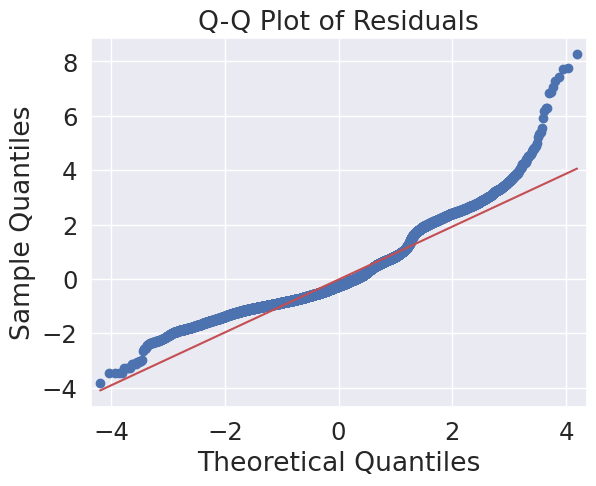

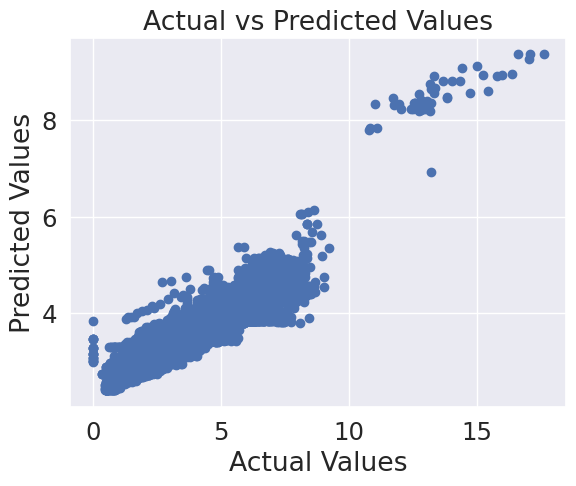

In [ ]:
# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

# Calculate Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print("Root Mean Squared Error:", rmse)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y_test, y_pred)
print("Mean Absolute Error:", mae)

# Calculate Explained Variance Score
evs = explained_variance_score(y_test, y_pred)
print("Explained Variance Score:", evs)

# Plot Residuals
residuals = y_test - y_pred
plt.scatter(y_pred, residuals)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.show()

# Quantile-Quantile (Q-Q) Plot of Residuals
import statsmodels.api as sm
qqplot = sm.qqplot(residuals, line='s')
plt.title('Q-Q Plot of Residuals')
plt.show()

# Visualize Predicted vs Actual Values
plt.scatter(y_test, y_pred)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.show()

In [ ]:
# Select features for testing
X_test = test_data[features]

# Make predictions on the test data
y_pred = xg_reg.predict(X_test)

# Create a DataFrame to store the predicted results
prediction_results = pd.DataFrame({'Title': test_data['title'],
                                   'Channel': test_data['channelTitle'],
                                   'Trending Date': test_data['trending_date'],
                                   'Actual View Velocity': test_data['view_velocity'],
                                   'Predicted View Velocity': y_pred})

# Display the prediction results
print(prediction_results)

                                                    Title  \
102391  Orange Bowl: Georgia Bulldogs vs. Michigan Wol...   
102393  Times Square 2022 Ball Drop in New York City: ...   
102396  Welcome to MOVE - A 30 Day Yoga Journey  |  Yo...   
102398  Happy New Year Live! 🎆 London Fireworks 2022 🔴...   
102399  Cotton Bowl: Alabama Crimson Tide vs. Cincinna...   
...                                                   ...   
176983              Dude Perfect vs. Luka Doncic (1-on-1)   
177913  Argentina and Lionel Messi are crowned World C...   
178160  Argentina and Lionel Messi are crowned World C...   
178379  Argentina and Lionel Messi are crowned World C...   
178581  Argentina and Lionel Messi are crowned World C...   

                      Channel Trending Date  Actual View Velocity  \
102391  ESPN College Football    2022-01-02              6.662381   
102393           News 19 WLTX    2022-01-02              6.655743   
102396      Yoga With Adriene    2022-01-02              6.5

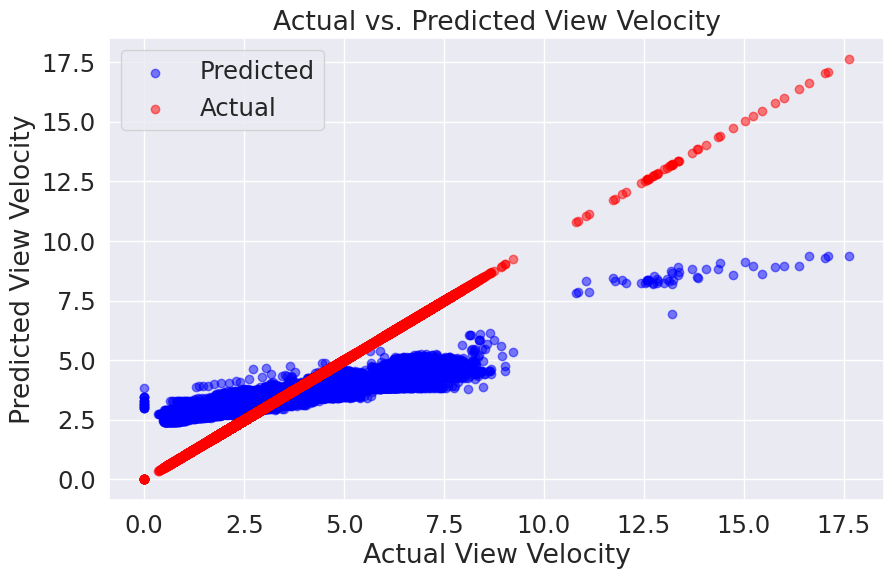

In [ ]:
# Create a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(prediction_results['Actual View Velocity'], prediction_results['Predicted View Velocity'], color='blue', label='Predicted', alpha=0.5)
plt.scatter(prediction_results['Actual View Velocity'], prediction_results['Actual View Velocity'], color='red', label='Actual', alpha=0.5)
plt.title('Actual vs. Predicted View Velocity')
plt.xlabel('Actual View Velocity')
plt.ylabel('Predicted View Velocity')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
def train_xgboost(learning_rate=0.1, max_depth=5, alpha=10, n_estimators=10):
    # Initialize the XGBoost Regressor model
    xg_reg = xgb.XGBRegressor(objective='reg:squarederror',
                              colsample_bytree=0.3,
                              learning_rate=learning_rate,
                              max_depth=max_depth,
                              alpha=alpha,
                              n_estimators=n_estimators,
                              random_state=0)

    # Fit the model to the training data
    xg_reg.fit(X_train, y_train)

    # Predict on the test set
    y_pred = xg_reg.predict(X_test)

    # Calculate Mean Squared Error (MSE)
    mse = mean_squared_error(y_test, y_pred)
    print("Mean Squared Error:", mse)

    # Calculate Root Mean Squared Error (RMSE)
    rmse = np.sqrt(mse)
    print("Root Mean Squared Error:", rmse)

    # Calculate Mean Absolute Error (MAE)
    mae = mean_absolute_error(y_test, y_pred)
    print("Mean Absolute Error:", mae)

    # Calculate Explained Variance Score
    evs = explained_variance_score(y_test, y_pred)
    print("Explained Variance Score:", evs)

    # Create a scatter plot
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_pred, color='blue', label='Predicted', alpha=0.5)
    plt.scatter(y_test, y_test, color='red', label='Actual', alpha=0.5)
    plt.title('Actual vs Predicted Values')
    plt.xlabel('Actual View Velocity')
    plt.ylabel('Predicted View Velocity')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Calculate Overall Accuracy
    non_zero_mask = y_test != 0
    overall_accuracy = 100 - np.mean(np.abs((y_pred - y_test) / np.maximum(y_test, 1e-10))[non_zero_mask]) * 100
    print(f'Overall Accuracy: {overall_accuracy:.2f}%')


    return y_test, y_pred

# Create sliders for hyperparameters
learning_rate_slider = widgets.FloatSlider(value=0.1, min=0.01, max=0.2, step=0.01, description='Learning Rate:')
max_depth_slider = widgets.IntSlider(value=5, min=1, max=10, step=1, description='Max Depth:')
alpha_slider = widgets.FloatSlider(value=10, min=1, max=20, step=1, description='Alpha:')
n_estimators_slider = widgets.IntSlider(value=10, min=1, max=100, step=1, description='n_estimators:')

# Create an interactive interface
interactive_plot = widgets.interactive(train_xgboost,
                                       learning_rate=learning_rate_slider,
                                       max_depth=max_depth_slider,
                                       alpha=alpha_slider,
                                       n_estimators=n_estimators_slider)

display(interactive_plot)

interactive(children=(FloatSlider(value=0.1, description='Learning Rate:', max=0.2, min=0.01, step=0.01), IntS…

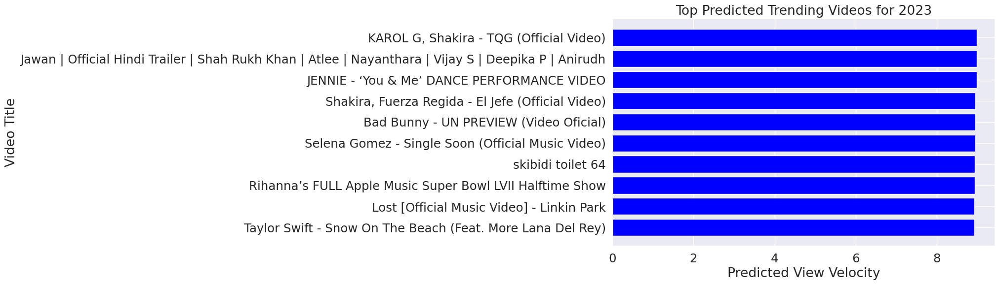

In [ ]:
# Select features for prediction
X_pred = prediction_data[features]

# Make predictions on the prediction data
predictions = xg_reg.predict(X_pred)

# Combine the predictions with video information
prediction_results = pd.DataFrame({'Title': prediction_data['title'], 'Channel': prediction_data['channelTitle'],
                                   'Published Date': prediction_data['publishedAt'], 'Trending Date': pd.to_datetime('2023-01-01'),
                                   'Predicted View Velocity': predictions})

# Sort the prediction results by predicted view velocity in descending order
prediction_results = prediction_results.sort_values(by='Predicted View Velocity', ascending=False)

# Visualize the top predicted videos
plt.figure(figsize=(10, 6))
plt.barh(prediction_results['Title'][:10], prediction_results['Predicted View Velocity'][:10], color='blue')
plt.xlabel('Predicted View Velocity')
plt.ylabel('Video Title')
plt.title('Top Predicted Trending Videos for 2023')
plt.gca().invert_yaxis()
plt.show()

Lasso


In [ ]:
from sklearn.linear_model import Lasso

In [ ]:
lasso_reg = Lasso(alpha=0.01)

In [ ]:
lasso_reg.fit(X_train, y_train)

# Predict on the test set
y_pred = lasso_reg.predict(X_test)

# Extract the 'view_velocity' column from test_data
y_test = test_data['view_velocity']

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)

print(f'Mean Squared Error: {mse}')

Mean Squared Error: 0.969332779213639


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.387e+04, tolerance: 3.552e+01
  model = cd_fast.enet_coordinate_descent(


Mean Squared Error: 0.969332779213639
Root Mean Squared Error: 0.9845469918767915
Mean Absolute Error: 0.6345773872352433
Explained Variance Score: 0.5695253094945347


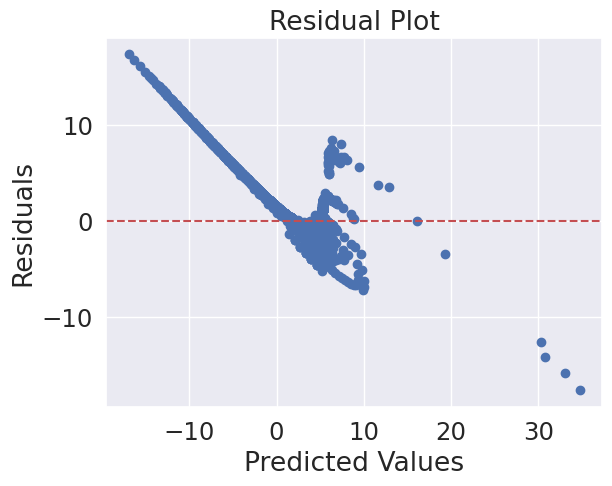

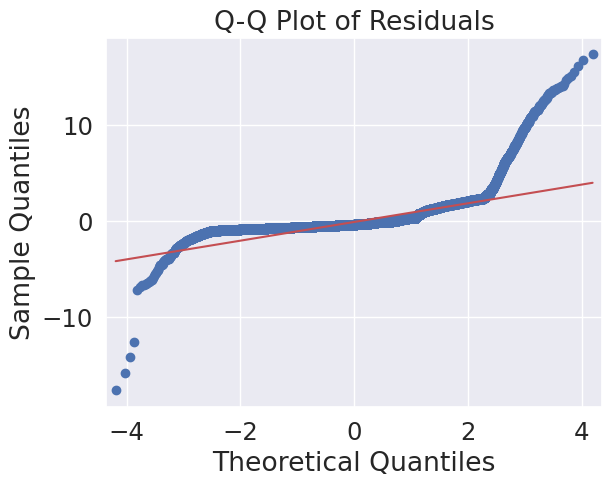

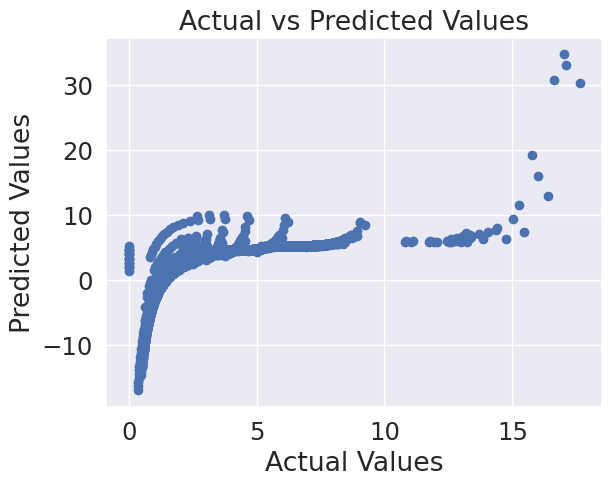

In [ ]:
# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

# Calculate Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print("Root Mean Squared Error:", rmse)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y_test, y_pred)
print("Mean Absolute Error:", mae)

# Calculate Explained Variance Score
evs = explained_variance_score(y_test, y_pred)
print("Explained Variance Score:", evs)

# Plot Residuals
residuals = y_test - y_pred
plt.scatter(y_pred, residuals)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.show()

# Quantile-Quantile (Q-Q) Plot of Residuals
import statsmodels.api as sm
qqplot = sm.qqplot(residuals, line='s')
plt.title('Q-Q Plot of Residuals')
plt.show()

# Visualize Predicted vs Actual Values
plt.scatter(y_test, y_pred)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.show()

In [ ]:
# Select features for testing
X_test = test_data[features]

# Make predictions on the test data
y_pred = lasso_reg.predict(X_test)

# Create a DataFrame to store the predicted results
prediction_results = pd.DataFrame({'Title': test_data['title'],
                                   'Channel': test_data['channelTitle'],
                                   'Trending Date': test_data['trending_date'],
                                   'Actual View Velocity': test_data['view_velocity'],
                                   'Predicted View Velocity': y_pred})

# Display the prediction results
print(prediction_results)

                                                    Title  \
102391  Orange Bowl: Georgia Bulldogs vs. Michigan Wol...   
102393  Times Square 2022 Ball Drop in New York City: ...   
102396  Welcome to MOVE - A 30 Day Yoga Journey  |  Yo...   
102398  Happy New Year Live! 🎆 London Fireworks 2022 🔴...   
102399  Cotton Bowl: Alabama Crimson Tide vs. Cincinna...   
...                                                   ...   
176983              Dude Perfect vs. Luka Doncic (1-on-1)   
177913  Argentina and Lionel Messi are crowned World C...   
178160  Argentina and Lionel Messi are crowned World C...   
178379  Argentina and Lionel Messi are crowned World C...   
178581  Argentina and Lionel Messi are crowned World C...   

                      Channel Trending Date  Actual View Velocity  \
102391  ESPN College Football    2022-01-02              6.662381   
102393           News 19 WLTX    2022-01-02              6.655743   
102396      Yoga With Adriene    2022-01-02              6.5

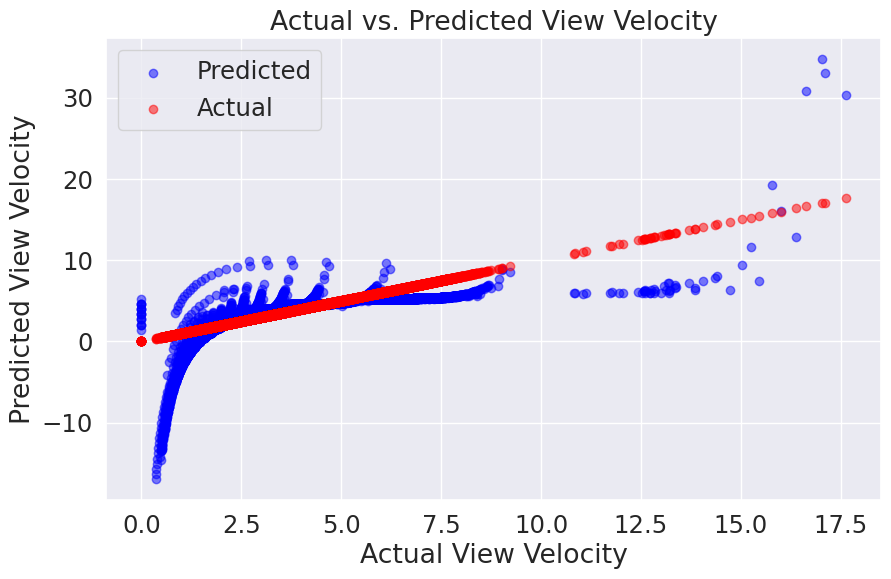

In [ ]:
# Create a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(prediction_results['Actual View Velocity'], prediction_results['Predicted View Velocity'], color='blue', label='Predicted', alpha=0.5)
plt.scatter(prediction_results['Actual View Velocity'], prediction_results['Actual View Velocity'], color='red', label='Actual', alpha=0.5)
plt.title('Actual vs. Predicted View Velocity')
plt.xlabel('Actual View Velocity')
plt.ylabel('Predicted View Velocity')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
def train_lasso(alpha=0.01):
    # Initialize the Lasso Regression model
    lasso_reg = Lasso(alpha=alpha)

    # Fit the model to the training data
    lasso_reg.fit(X_train, y_train)

    # Predict on the test set
    y_pred = lasso_reg.predict(X_test)

    # Calculate Mean Squared Error (MSE)
    mse = mean_squared_error(y_test, y_pred)
    print("Mean Squared Error:", mse)

    # Calculate Root Mean Squared Error (RMSE)
    rmse = np.sqrt(mse)
    print("Root Mean Squared Error:", rmse)

    # Calculate Mean Absolute Error (MAE)
    mae = mean_absolute_error(y_test, y_pred)
    print("Mean Absolute Error:", mae)

    # Calculate Explained Variance Score
    evs = explained_variance_score(y_test, y_pred)
    print("Explained Variance Score:", evs)

    # Create a scatter plot
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_pred, color='blue', label='Predicted', alpha=0.5)
    plt.scatter(y_test, y_test, color='red', label='Actual', alpha=0.5)
    plt.title('Actual vs Predicted Values')
    plt.xlabel('Actual View Velocity')
    plt.ylabel('Predicted View Velocity')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Calculate Overall Accuracy
    non_zero_mask = y_test != 0
    overall_accuracy = 100 - np.mean(np.abs((y_pred - y_test) / np.maximum(y_test, 1e-10))[non_zero_mask]) * 100
    print(f'Overall Accuracy: {overall_accuracy:.2f}%')


    return y_test, y_pred

# Create sliders for hyperparameters
alpha_slider = widgets.FloatSlider(value=0.01, min=0.001, max=0.1, step=0.001, description='Alpha:')

# Create an interactive interface
interactive_plot = widgets.interactive(train_lasso, alpha=alpha_slider)
display(interactive_plot)

interactive(children=(FloatSlider(value=0.01, description='Alpha:', max=0.1, min=0.001, step=0.001), Output())…

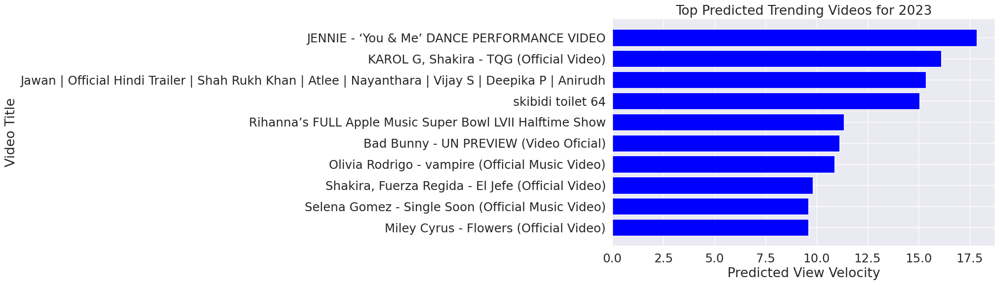

In [ ]:
# Select features for prediction
X_pred = prediction_data[features]

# Make predictions on the prediction data
predictions = lasso_reg.predict(X_pred)

# Combine the predictions with video information
prediction_results = pd.DataFrame({'Title': prediction_data['title'], 'Channel': prediction_data['channelTitle'],
                                   'Published Date': prediction_data['publishedAt'], 'Trending Date': pd.to_datetime('2023-01-01'),
                                   'Predicted View Velocity': predictions})

# Sort the prediction results by predicted view velocity in descending order
prediction_results = prediction_results.sort_values(by='Predicted View Velocity', ascending=False)

# Visualize the top predicted videos
plt.figure(figsize=(10, 6))
plt.barh(prediction_results['Title'][:10], prediction_results['Predicted View Velocity'][:10], color='blue')
plt.xlabel('Predicted View Velocity')
plt.ylabel('Video Title')
plt.title('Top Predicted Trending Videos for 2023')
plt.gca().invert_yaxis()
plt.show()

KNeighborsRegressor

In [ ]:
from sklearn.neighbors import KNeighborsRegressor

In [ ]:
knn_reg = KNeighborsRegressor(n_neighbors=5)  # You can experiment with different values of n_neighbors

# Fit the model to the training data
knn_reg.fit(X_train, y_train)

# Predict on the test set
y_pred = knn_reg.predict(X_test)

# Extract the 'view_velocity' column from test_data
y_test = test_data['view_velocity']

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)

print(f'Mean Squared Error: {mse}')

Mean Squared Error: 2.652055841746089


Mean Squared Error: 2.652055841746089
Root Mean Squared Error: 1.6285133839628365
Mean Absolute Error: 1.2278536843212535
Explained Variance Score: -0.18040198944287522


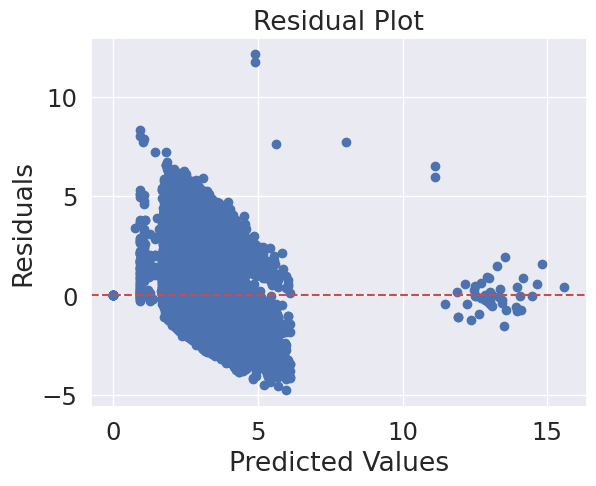

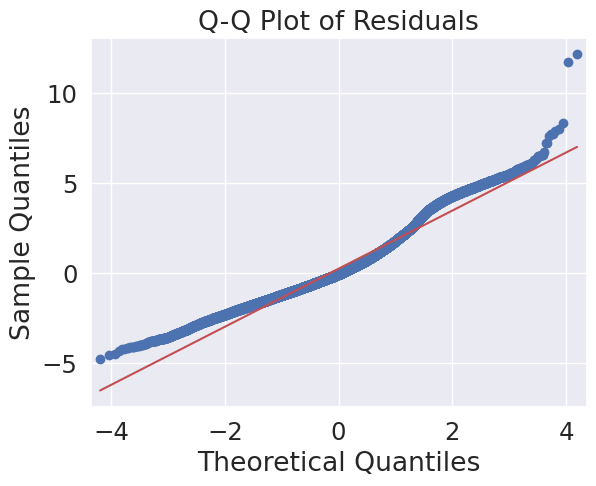

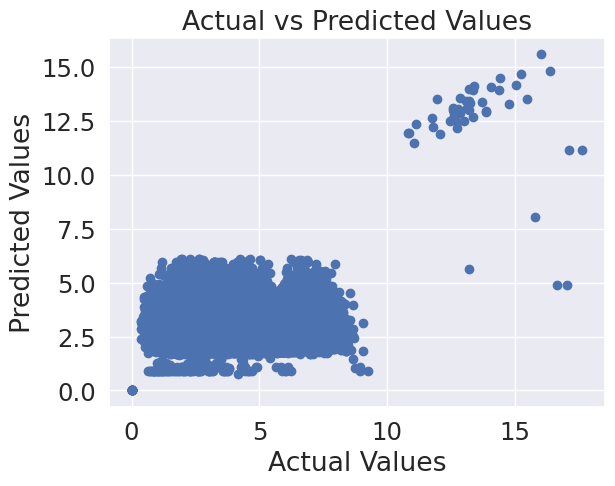

In [ ]:
# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

# Calculate Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print("Root Mean Squared Error:", rmse)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y_test, y_pred)
print("Mean Absolute Error:", mae)

# Calculate Explained Variance Score
evs = explained_variance_score(y_test, y_pred)
print("Explained Variance Score:", evs)

# Plot Residuals
residuals = y_test - y_pred
plt.scatter(y_pred, residuals)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.show()

# Quantile-Quantile (Q-Q) Plot of Residuals
import statsmodels.api as sm
qqplot = sm.qqplot(residuals, line='s')
plt.title('Q-Q Plot of Residuals')
plt.show()

# Visualize Predicted vs Actual Values
plt.scatter(y_test, y_pred)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.show()

In [ ]:
# Select features for testing
X_test = test_data[features]

# Make predictions on the test data
y_pred = knn_reg.predict(X_test)

# Create a DataFrame to store the predicted results
prediction_results = pd.DataFrame({'Title': test_data['title'],
                                   'Channel': test_data['channelTitle'],
                                   'Trending Date': test_data['trending_date'],
                                   'Actual View Velocity': test_data['view_velocity'],
                                   'Predicted View Velocity': y_pred})

# Display the prediction results
print(prediction_results)

                                                    Title  \
102391  Orange Bowl: Georgia Bulldogs vs. Michigan Wol...   
102393  Times Square 2022 Ball Drop in New York City: ...   
102396  Welcome to MOVE - A 30 Day Yoga Journey  |  Yo...   
102398  Happy New Year Live! 🎆 London Fireworks 2022 🔴...   
102399  Cotton Bowl: Alabama Crimson Tide vs. Cincinna...   
...                                                   ...   
176983              Dude Perfect vs. Luka Doncic (1-on-1)   
177913  Argentina and Lionel Messi are crowned World C...   
178160  Argentina and Lionel Messi are crowned World C...   
178379  Argentina and Lionel Messi are crowned World C...   
178581  Argentina and Lionel Messi are crowned World C...   

                      Channel Trending Date  Actual View Velocity  \
102391  ESPN College Football    2022-01-02              6.662381   
102393           News 19 WLTX    2022-01-02              6.655743   
102396      Yoga With Adriene    2022-01-02              6.5

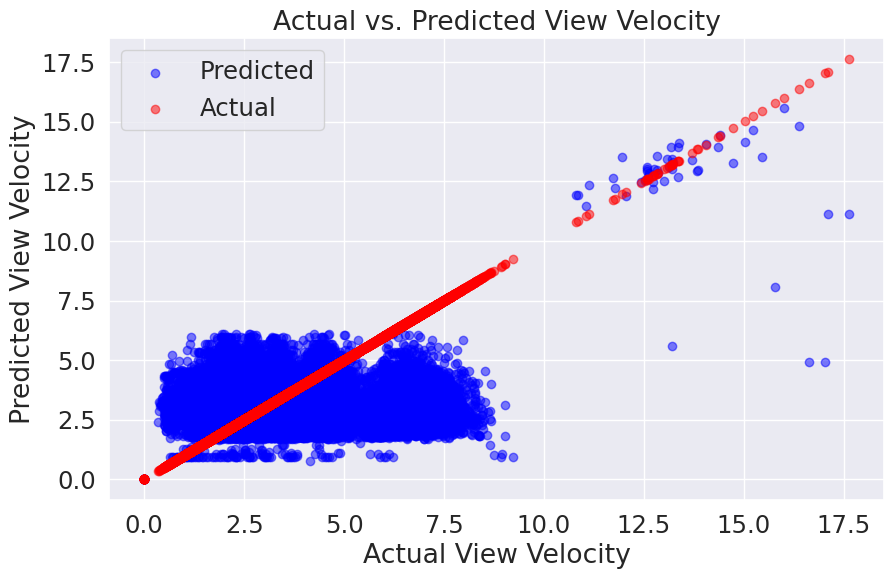

In [ ]:
# Create a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(prediction_results['Actual View Velocity'], prediction_results['Predicted View Velocity'], color='blue', label='Predicted', alpha=0.5)
plt.scatter(prediction_results['Actual View Velocity'], prediction_results['Actual View Velocity'], color='red', label='Actual', alpha=0.5)
plt.title('Actual vs. Predicted View Velocity')
plt.xlabel('Actual View Velocity')
plt.ylabel('Predicted View Velocity')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
def train_knn(n_neighbors=5):
    # Initialize the KNeighbors Regressor model
    knn_reg = KNeighborsRegressor(n_neighbors=n_neighbors)

    # Fit the model to the training data
    knn_reg.fit(X_train, y_train)

    # Predict on the test set
    y_pred = knn_reg.predict(X_test)

    # Calculate Mean Squared Error (MSE)
    mse = mean_squared_error(y_test, y_pred)
    print("Mean Squared Error:", mse)

    # Calculate Root Mean Squared Error (RMSE)
    rmse = np.sqrt(mse)
    print("Root Mean Squared Error:", rmse)

    # Calculate Mean Absolute Error (MAE)
    mae = mean_absolute_error(y_test, y_pred)
    print("Mean Absolute Error:", mae)

    # Calculate Explained Variance Score
    evs = explained_variance_score(y_test, y_pred)
    print("Explained Variance Score:", evs)

    # Create a scatter plot
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_pred, color='blue', label='Predicted', alpha=0.5)
    plt.scatter(y_test, y_test, color='red', label='Actual', alpha=0.5)
    plt.title('Actual vs Predicted Values')
    plt.xlabel('Actual View Velocity')
    plt.ylabel('Predicted View Velocity')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Calculate Overall Accuracy
    overall_accuracy = 100 - np.mean(np.abs(y_pred - y_test) / y_test) * 100
    print(f'Overall Accuracy: {overall_accuracy:.2f}%')


    return y_test, y_pred

# Create sliders for hyperparameters
n_neighbors_slider = widgets.IntSlider(value=5, min=1, max=20, step=1, description='n_neighbors:')

# Create an interactive interface
interactive_plot = widgets.interactive(train_knn, n_neighbors=n_neighbors_slider)
display(interactive_plot)

interactive(children=(IntSlider(value=5, description='n_neighbors:', max=20, min=1), Output()), _dom_classes=(…

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 50668 (\N{HANGUL SYLLABLE YEO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51088 (\N{HANGUL SYLLABLE JA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 50500 (\N{HANGUL SYLLABLE A}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51060 (\N{HANGUL SYLLABLE I}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 46308 (\N{HANGUL SYLLABLE DEUL}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


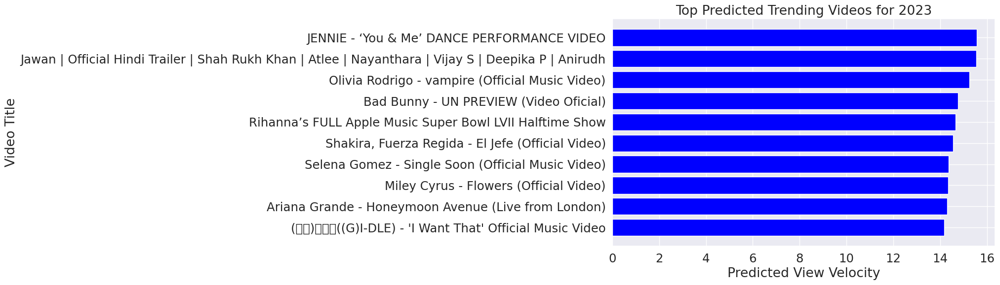

In [ ]:
# Select features for prediction
X_pred = prediction_data[features]

# Make predictions on the prediction data
predictions = knn_reg.predict(X_pred)

# Combine the predictions with video information
prediction_results = pd.DataFrame({'Title': prediction_data['title'], 'Channel': prediction_data['channelTitle'],
                                   'Published Date': prediction_data['publishedAt'], 'Trending Date': pd.to_datetime('2023-01-01'),
                                   'Predicted View Velocity': predictions})

# Sort the prediction results by predicted view velocity in descending order
prediction_results = prediction_results.sort_values(by='Predicted View Velocity', ascending=False)

# Visualize the top predicted videos
plt.figure(figsize=(10, 6))
plt.barh(prediction_results['Title'][:10], prediction_results['Predicted View Velocity'][:10], color='blue')
plt.xlabel('Predicted View Velocity')
plt.ylabel('Video Title')
plt.title('Top Predicted Trending Videos for 2023')
plt.gca().invert_yaxis()
plt.show()

In [ ]:
# Store y_pred arrays for each model
y_pred_linear_reg = []
y_pred_xgboost = []
y_pred_lasso = []
y_pred_knn = []

# Linear Regression
linearRegModel = LinearRegression()
linearRegModel.fit(X_train, y_train)
y_pred = linearRegModel.predict(X_test)
y_pred_linear_reg.append(y_pred)

# XGBoost
xg_reg = xgb.XGBRegressor(objective='reg:squarederror', colsample_bytree=0.3,
                          learning_rate=0.1, max_depth=5, alpha=10, n_estimators=10)
xg_reg.fit(X_train, y_train)
y_pred = xg_reg.predict(X_test)
y_pred_xgboost.append(y_pred)

# Lasso
lasso_reg = Lasso(alpha=0.01)
lasso_reg.fit(X_train, y_train)
y_pred = lasso_reg.predict(X_test)
y_pred_lasso.append(y_pred)

# KNeighbors Regressor
knn_reg = KNeighborsRegressor(n_neighbors=5)
knn_reg.fit(X_train, y_train)
y_pred = knn_reg.predict(X_test)
y_pred_knn.append(y_pred)

# Access the y_pred arrays for each model using y_pred_linear_reg, y_pred_xgboost, y_pred_lasso, y_pred_knn

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.387e+04, tolerance: 3.552e+01
  model = cd_fast.enet_coordinate_descent(


Final Weighted Predictions:
[ 5.15739578  5.04408803  5.33505978 ... -3.14845359 -3.35303063
 -3.58639764]


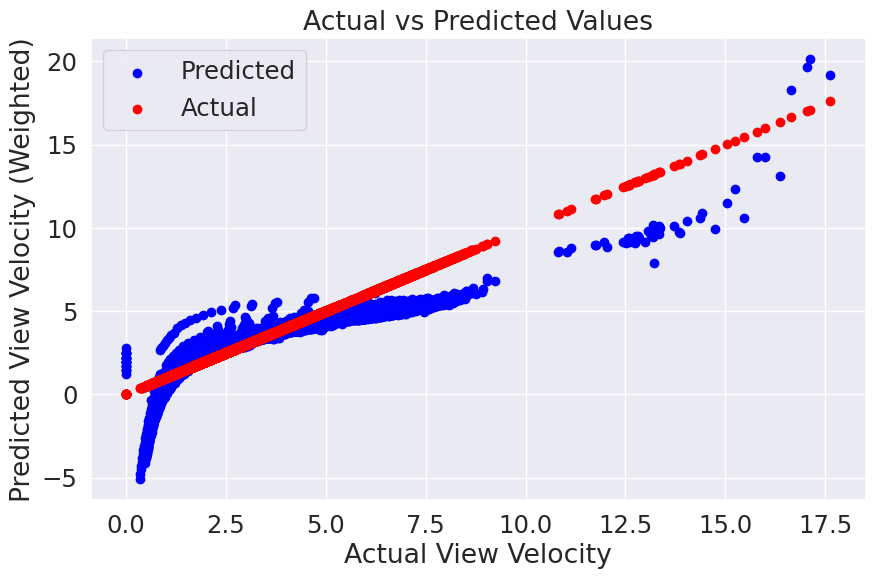

Overall Accuracy: 83.66%


In [ ]:
y_pred_linear_reg = np.array(y_pred_linear_reg)
y_pred_xgboost = np.array(y_pred_xgboost)
y_pred_lasso = np.array(y_pred_lasso)
y_pred_knn = np.array(y_pred_knn)
y_pred_random_forest = np.array(y_pred_random_forest)

# Stack all predictions into a 2D array
predictions = np.vstack([y_pred_linear_reg, y_pred_xgboost, y_pred_lasso, y_pred_knn, y_pred_random_forest]).T

# Replace with your actual model scores
model_scores = np.array([0.75, 0.95, 0.73, 0.62,0.99])

# Normalize scores to sum to 1 (convert to weights)
weights = model_scores / np.sum(model_scores)

# Calculate the weighted average prediction across all models
final_prediction_weighted = np.dot(predictions, weights)

# Print the final weighted predictions
print("Final Weighted Predictions:")
print(final_prediction_weighted)

# Assuming 'view_velocity' is your target variable
y_test = test_data['view_velocity']

# Now, let's plot the scatter plot with y_test and final_prediction_weighted
plt.figure(figsize=(10, 6))
plt.scatter(y_test, final_prediction_weighted, color='blue', label='Predicted')
plt.scatter(y_test, y_test, color='red', label='Actual')
plt.title('Actual vs Predicted Values')
plt.xlabel('Actual View Velocity')
plt.ylabel('Predicted View Velocity (Weighted)')
plt.legend()
plt.grid(True)
plt.show()

# Set a threshold for accuracy calculation
threshold = 0.05

# Calculate the absolute percentage error
absolute_percentage_error = np.abs((final_prediction_weighted - y_test) / y_test)

# Calculate overall accuracy
overall_accuracy =( 1 - np.mean(absolute_percentage_error <= threshold)) * 100

# Print overall accuracy
print(f'Overall Accuracy: {overall_accuracy:.2f}%')




/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 48169 (\N{HANGUL SYLLABLE BANG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 53444 (\N{HANGUL SYLLABLE TAN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49548 (\N{HANGUL SYLLABLE SO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 45380 (\N{HANGUL SYLLABLE NYEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 45800 (\N{HANGUL SYLLABLE DAN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


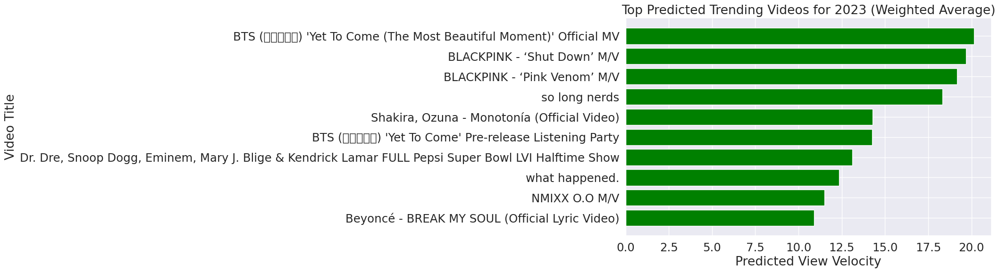

In [ ]:
# Assuming you have the X_pred DataFrame prepared as in the previous code

# Make predictions using the final weighted predictions
final_predictions = final_prediction_weighted

# Combine the predictions with video information
prediction_results_weighted = pd.DataFrame({'Title': test_data['title'], 'Channel':  test_data['channelTitle'],
                                   'Published Date':  test_data['publishedAt'], 'Trending Date': pd.to_datetime('2023-01-01'),
                                   'Predicted View Velocity': final_predictions})

# Sort the prediction results by predicted view velocity in descending order
prediction_results_weighted = prediction_results_weighted.sort_values(by='Predicted View Velocity', ascending=False)

# Visualize the top predicted videos
plt.figure(figsize=(10, 6))
plt.barh(prediction_results_weighted['Title'][:10], prediction_results_weighted['Predicted View Velocity'][:10], color='green')
plt.xlabel('Predicted View Velocity')
plt.ylabel('Video Title')
plt.title('Top Predicted Trending Videos for 2023 (Weighted Average)')
plt.gca().invert_yaxis()
plt.show()
